In [ ]:
!pip install keras_nlp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import keras_nlp
import tensorflow as tf
from tensorflow import keras

In [ ]:
BATCH_SIZE = 64
SEQ_LEN = 128
MIN_TRAINING_SEQ_LEN = 450

# Model
EMBED_DIM = 256
FEED_FORWARD_DIM = 256
NUM_HEADS = 3
NUM_LAYERS = 16
VOCAB_SIZE = 30000 # Limits parameters in model.

# Training
EPOCHS = 30

# Inference
NUM_TOKENS_TO_GENERATE = 80

In [ ]:
# Inference

raw_train_ds = (
    tf.data.TextLineDataset('/content/0418.txt')
    .filter(lambda x: tf.strings.length(x) > MIN_TRAINING_SEQ_LEN)
    .batch(BATCH_SIZE)
    .shuffle(buffer_size=256)
)

# Load simplebooks-92 validation set and filter out short lines.
raw_val_ds =(
     tf.data.TextLineDataset('/content/0418.txt')
    .filter(lambda x: tf.strings.length(x) > MIN_TRAINING_SEQ_LEN)
    .batch(BATCH_SIZE)
)

In [ ]:
vocab = keras_nlp.tokenizers.compute_word_piece_vocabulary(
    raw_train_ds,
    vocabulary_size=VOCAB_SIZE,
    lowercase=True,
    reserved_tokens=["[PAD]", "[UNK]", "[BOS]"],
)

In [ ]:
tokenizer = keras_nlp.tokenizers.WordPieceTokenizer(
    vocabulary=vocab,
    sequence_length=SEQ_LEN,
    lowercase=True,
)

In [ ]:
start_packer = keras_nlp.layers.StartEndPacker(
    sequence_length=SEQ_LEN,
    start_value=tokenizer.token_to_id("[BOS]"),
)


def preprocess(inputs):
    outputs = tokenizer(inputs)
    features = start_packer(outputs)
    labels = outputs
    return features, labels


# Tokenize and split into train and label sequences.
train_ds = raw_train_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE).prefetch(
    tf.data.AUTOTUNE
)
val_ds = raw_val_ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE).prefetch(
    tf.data.AUTOTUNE
)

In [ ]:
inputs = keras.layers.Input(shape=(None,), dtype=tf.int32)
# Embedding.
embedding_layer = keras_nlp.layers.TokenAndPositionEmbedding(
    vocabulary_size=VOCAB_SIZE,
    sequence_length=SEQ_LEN,
    embedding_dim=EMBED_DIM,
    mask_zero=True,
)
x = embedding_layer(inputs)
# Transformer decoders.
for _ in range(NUM_LAYERS):
    decoder_layer = keras_nlp.layers.TransformerDecoder(
        num_heads=NUM_HEADS,
        intermediate_dim=FEED_FORWARD_DIM,
    )
    x = decoder_layer(x)  # Giving one argument only skips cross-attention.
# Output.
outputs = keras.layers.Dense(VOCAB_SIZE)(x)
model = keras.Model(inputs=inputs, outputs=outputs)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
perplexity = keras_nlp.metrics.Perplexity(from_logits=True, mask_token_id=0)
model.compile(optimizer="adam", loss=loss_fn, metrics=[perplexity])

In [ ]:
model.fit(train_ds, validation_data=val_ds, verbose=2, epochs=20)

Epoch 1/20
1/1 - 48s - loss: 10.2992 - perplexity: 29707.7949 - val_loss: 9.9052 - val_perplexity: 20034.6797 - 48s/epoch - 48s/step
Epoch 2/20
1/1 - 2s - loss: 9.9052 - perplexity: 20034.6602 - val_loss: 9.5243 - val_perplexity: 13688.3525 - 2s/epoch - 2s/step
Epoch 3/20
1/1 - 2s - loss: 9.5243 - perplexity: 13688.3525 - val_loss: 9.1609 - val_perplexity: 9517.6289 - 2s/epoch - 2s/step
Epoch 4/20
1/1 - 3s - loss: 9.1609 - perplexity: 9517.6289 - val_loss: 8.7716 - val_perplexity: 6448.5171 - 3s/epoch - 3s/step
Epoch 5/20
1/1 - 4s - loss: 8.7716 - perplexity: 6448.5171 - val_loss: 8.3737 - val_perplexity: 4331.5352 - 4s/epoch - 4s/step
Epoch 6/20
1/1 - 2s - loss: 8.3737 - perplexity: 4331.5352 - val_loss: 7.9625 - val_perplexity: 2871.2698 - 2s/epoch - 2s/step
Epoch 7/20
1/1 - 3s - loss: 7.9625 - perplexity: 2871.2698 - val_loss: 7.5423 - val_perplexity: 1886.1699 - 3s/epoch - 3s/step
Epoch 8/20
1/1 - 3s - loss: 7.5423 - perplexity: 1886.1699 - val_loss: 7.1178 - val_perplexity: 1233.7

In [ ]:
def token_logits_fn(inputs):
    cur_len = inputs.shape[1]
    output = model(inputs)
    return output[:, cur_len - 1, :]  # return next token logits


In [ ]:
input_text = "Regional equities were mostly"
tokenized_input = tokenizer.tokenize(input_text)
tokenized_input_with_bos = tf.convert_to_tensor([[tokenizer.token_to_id("[BOS]")] + tokenized_input])


In [ ]:
import keras_nlp
print(keras_nlp.__version__)

0.5.1


In [ ]:
output_tokens = keras_nlp.utils.top_p_search(
    token_logits_fn,
    tokenized_input_with_bos,
    max_length=12,
    p=0.5,
    from_logits=True,
)

AttributeError: ignored

In [ ]:
generated_text = tokenizer.detokenize(output_tokens)
print(f"Generated text: \n{generated_text}\n")

NameError: ignored

In [ ]:
import os
import pandas as pd
import numpy as np
import torch
import tensorflow as tf
import matplotlib.pyplot as plt

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


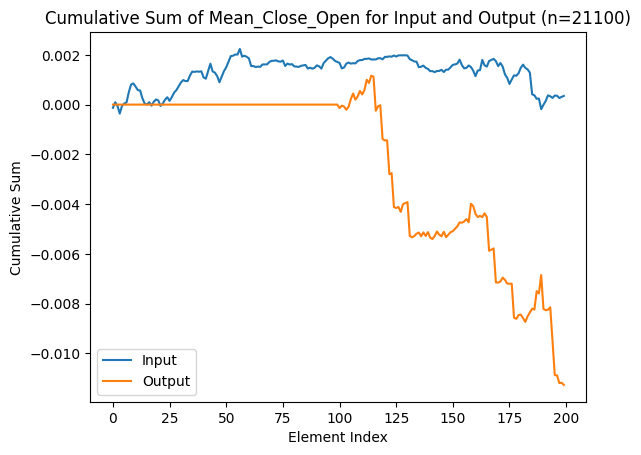

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


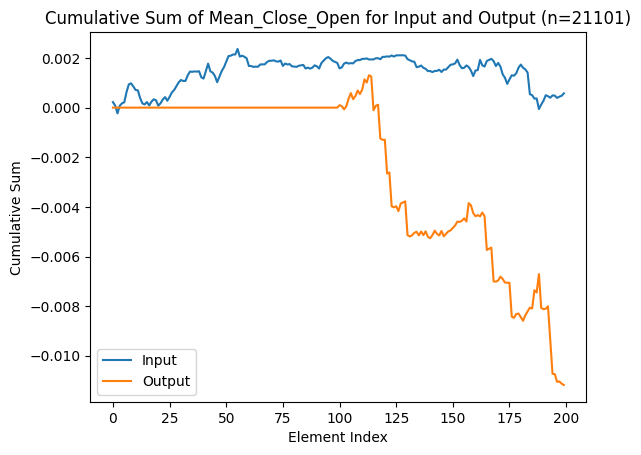

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


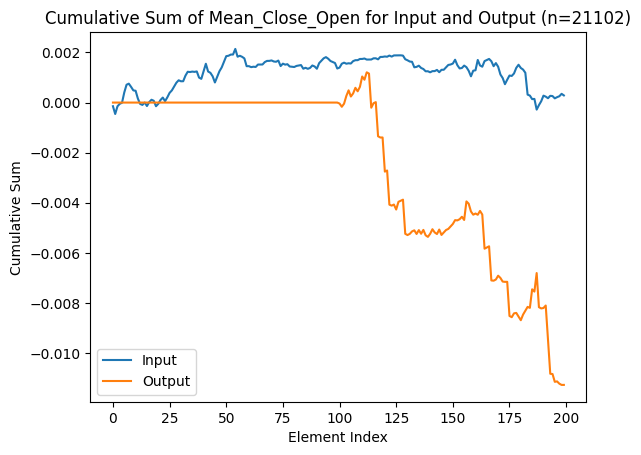

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


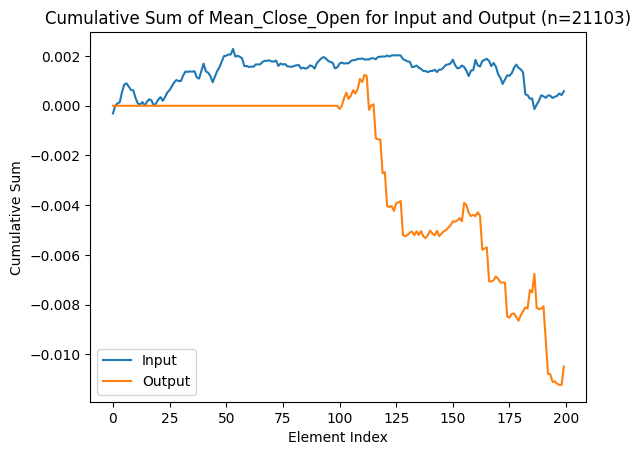

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


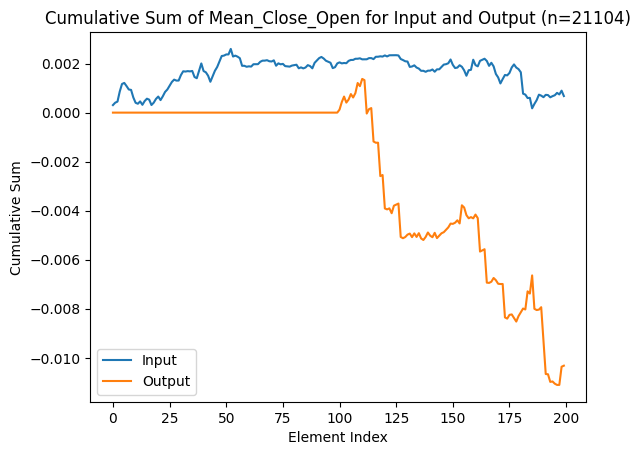

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


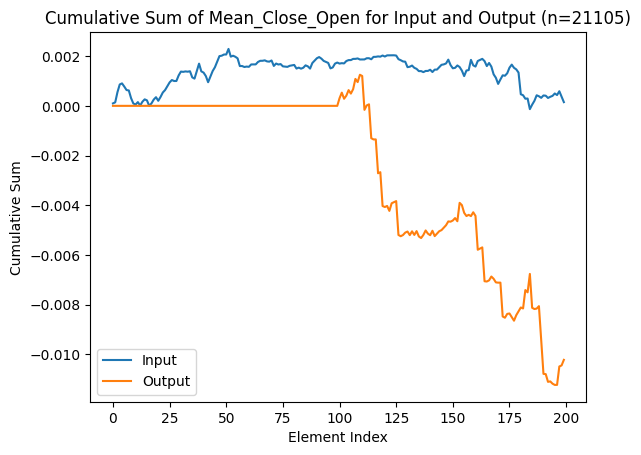

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


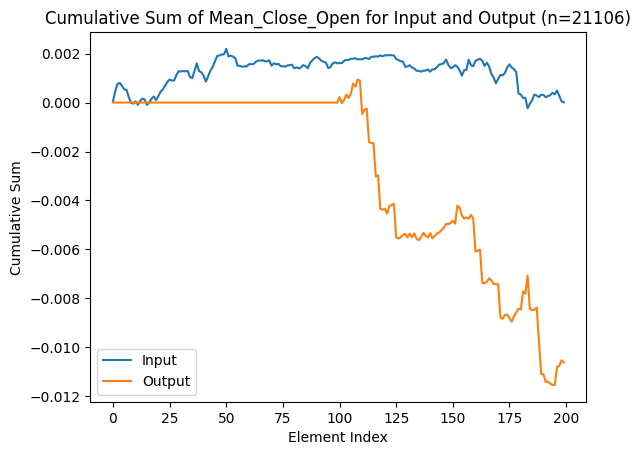

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


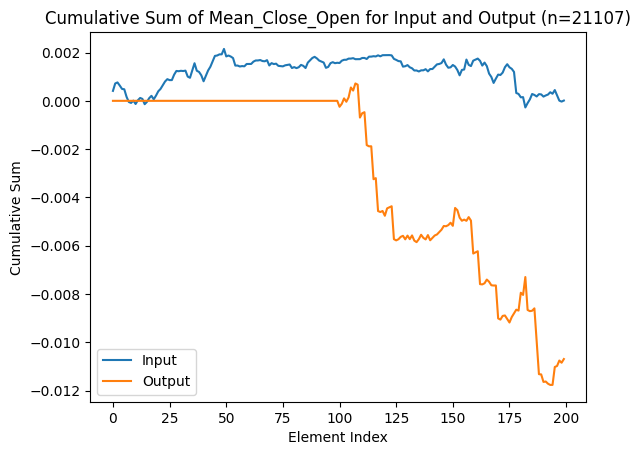

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


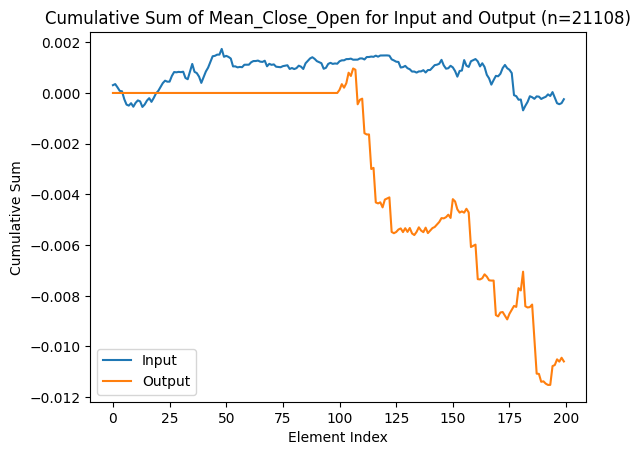

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


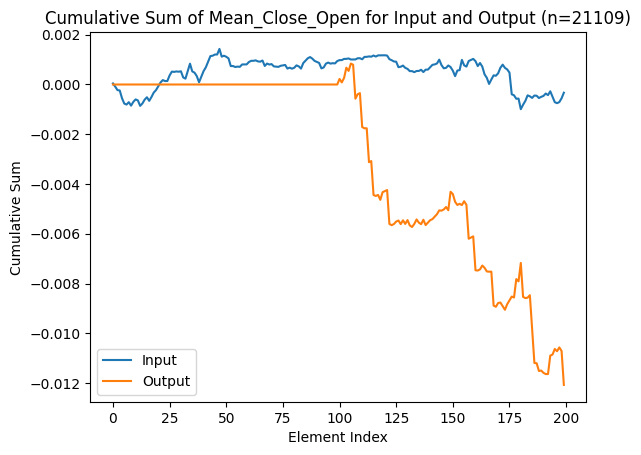

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


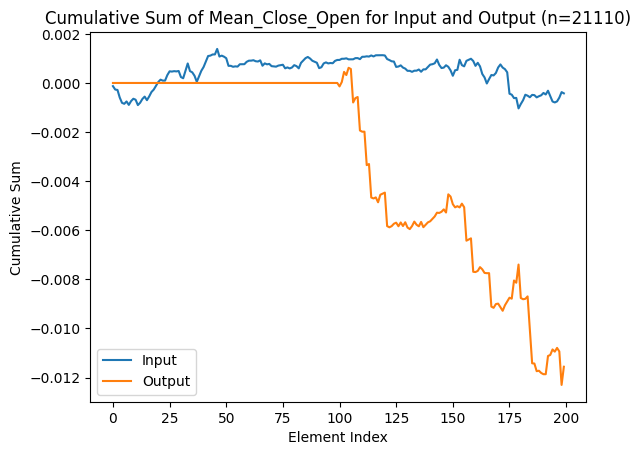

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


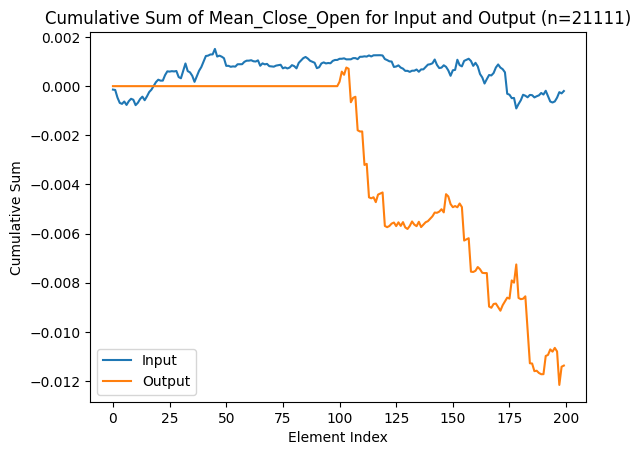

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


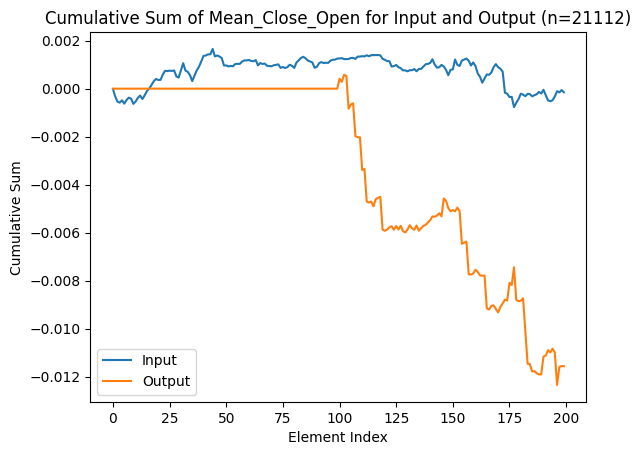

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


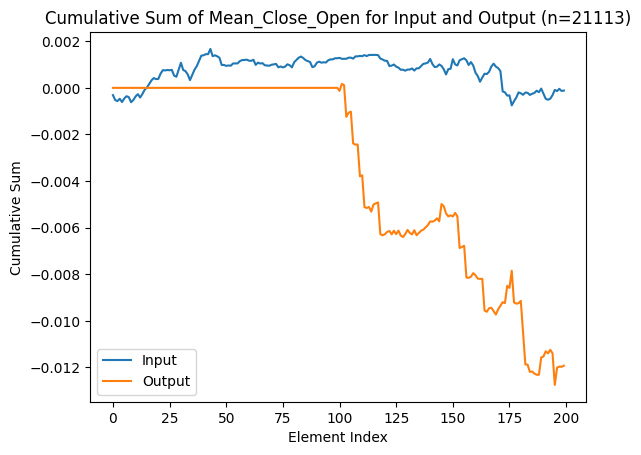

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


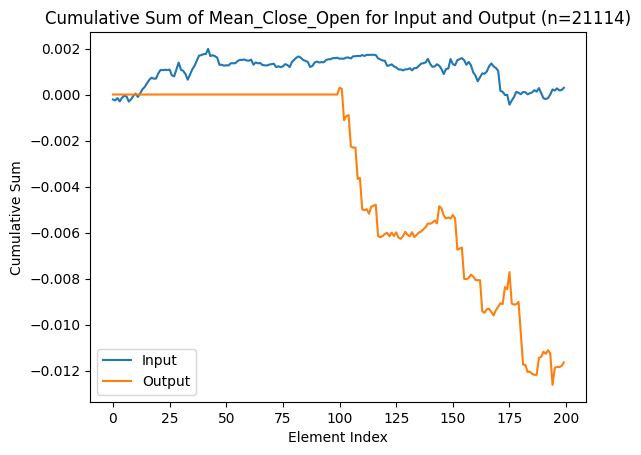

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


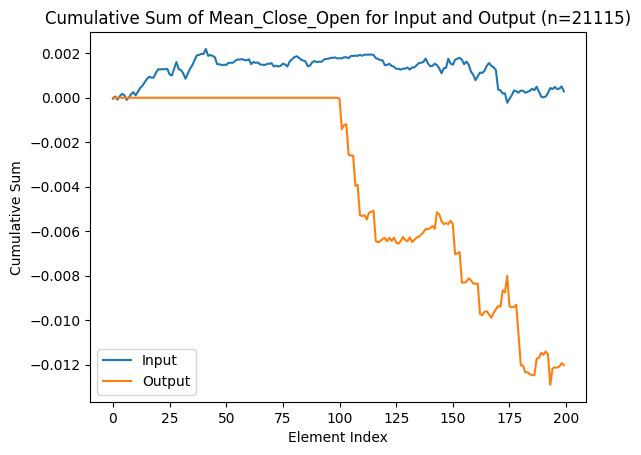

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


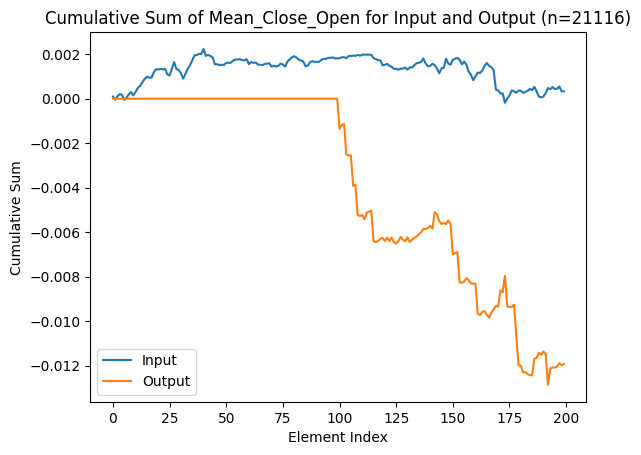

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


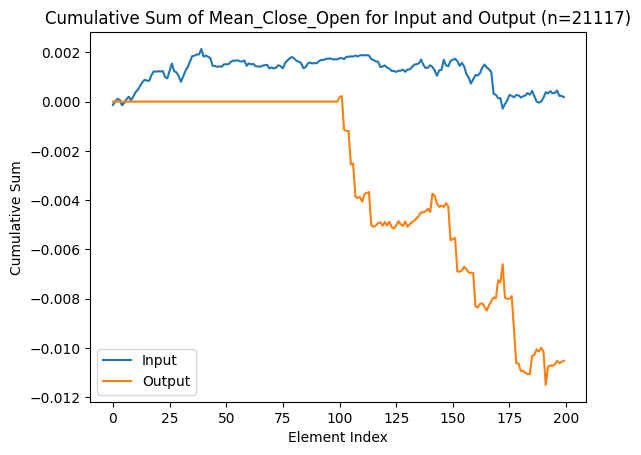

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


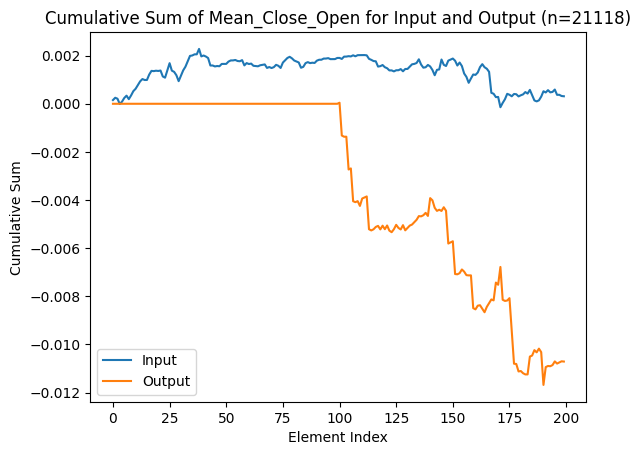

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


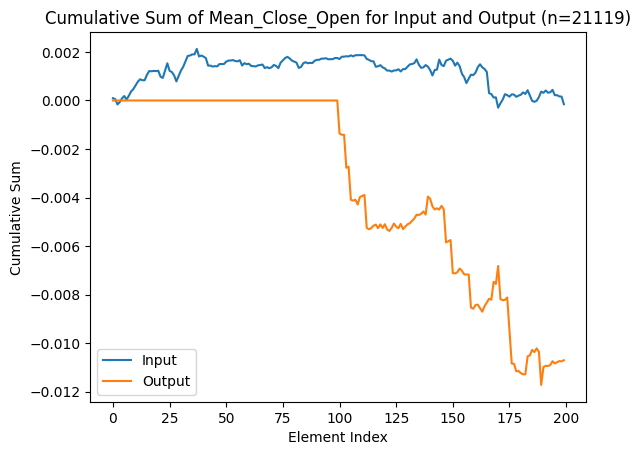

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


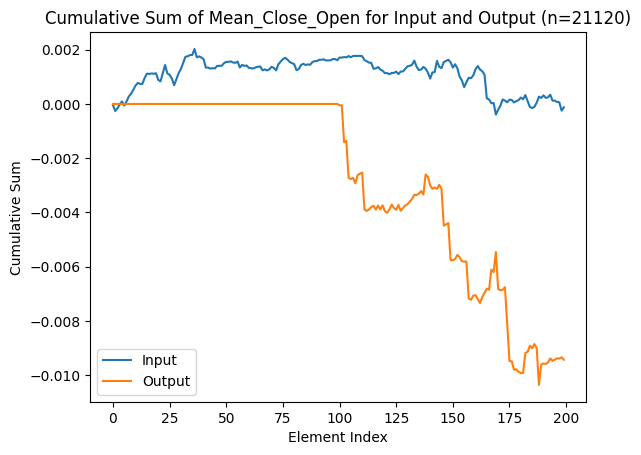

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


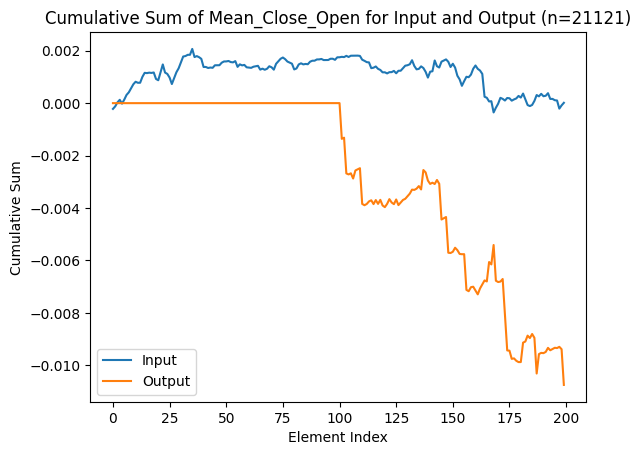

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


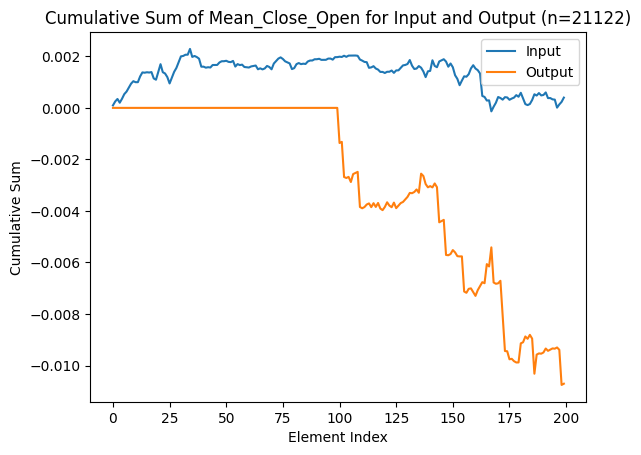

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


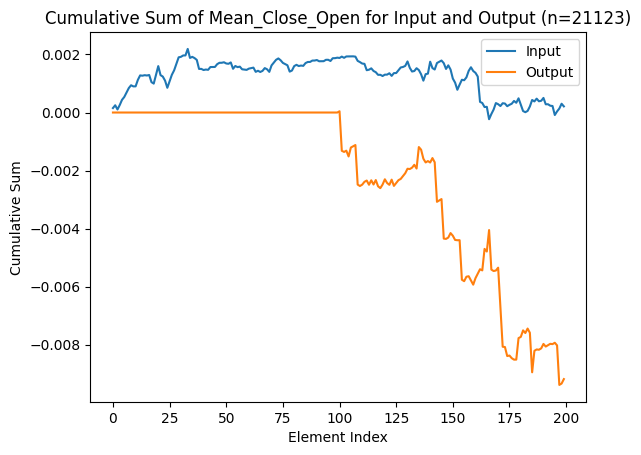

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


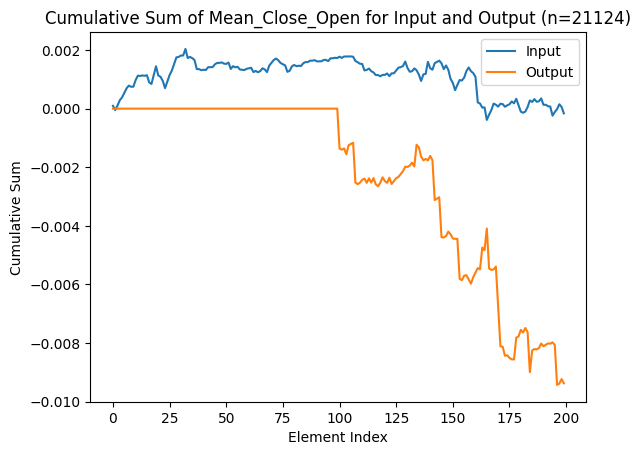

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


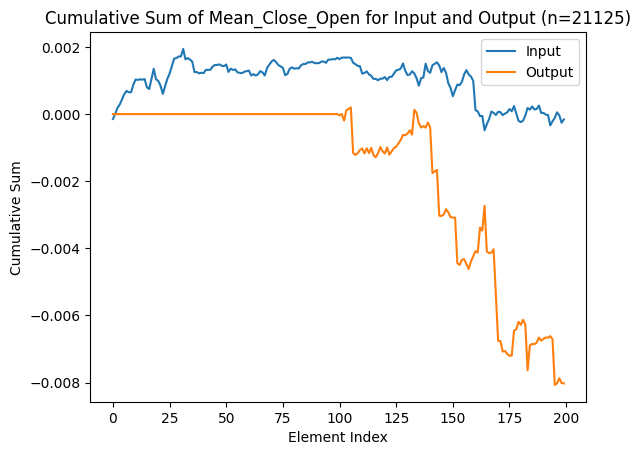

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


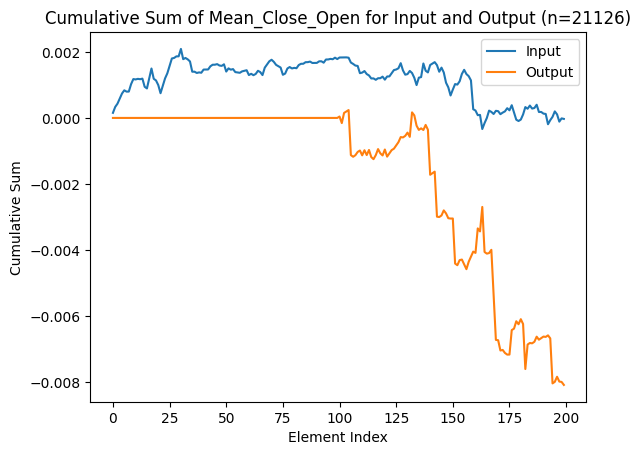

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


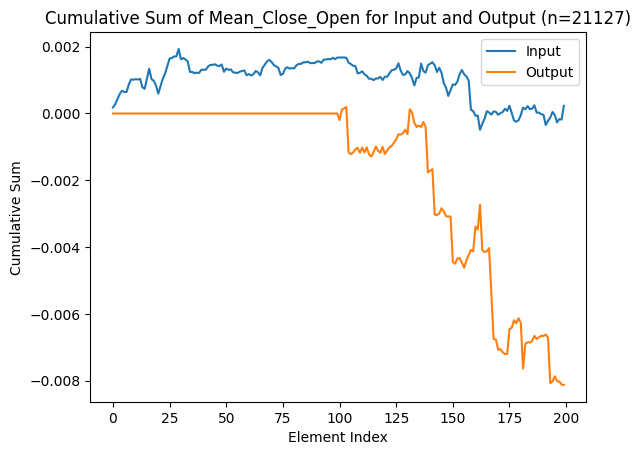

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


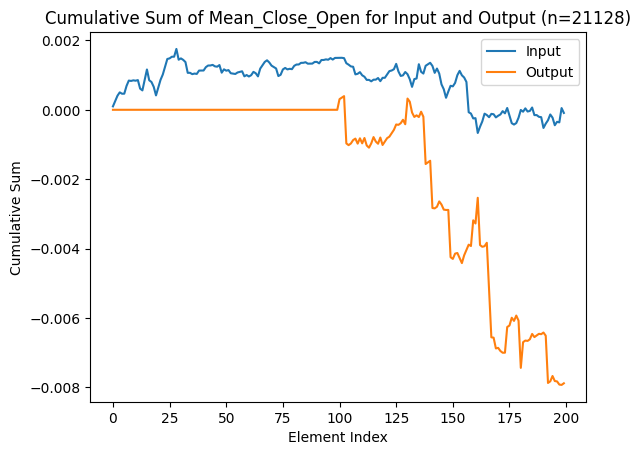

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


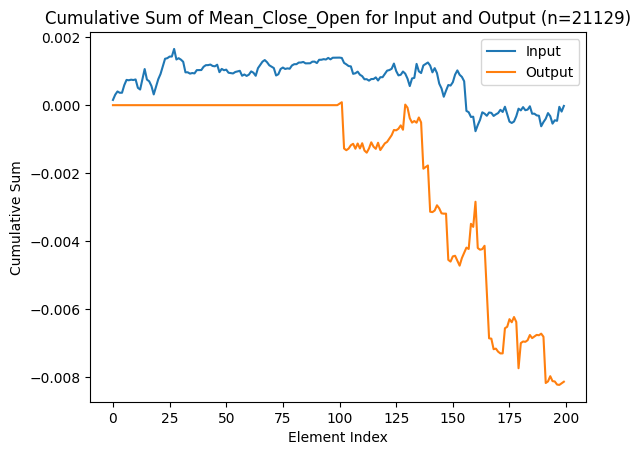

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


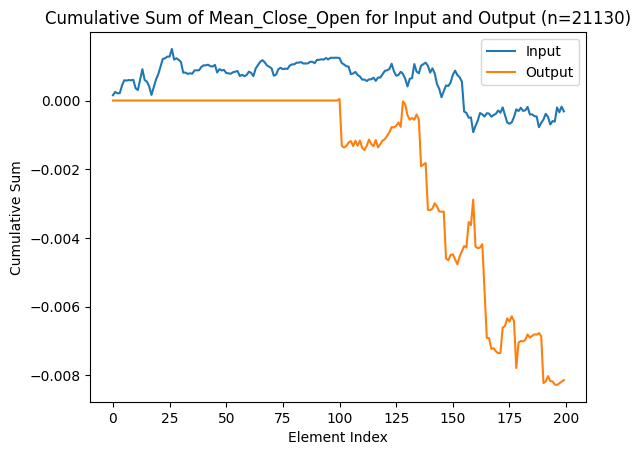

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


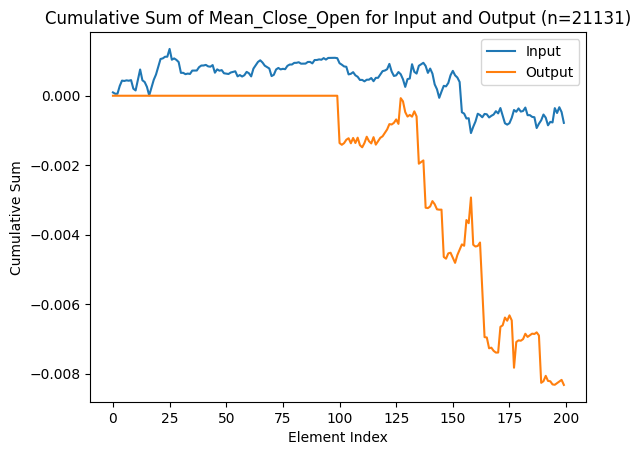

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


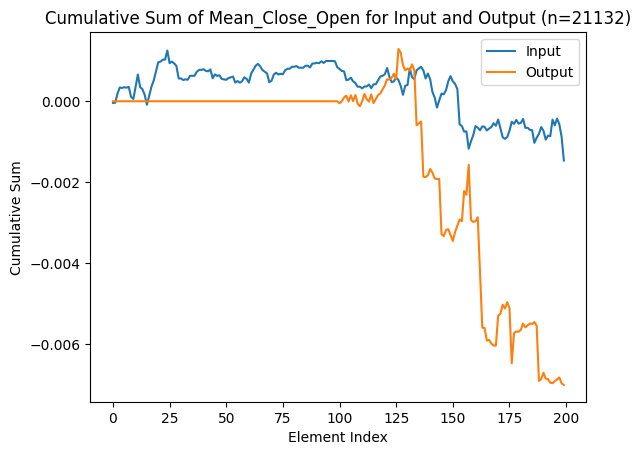

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


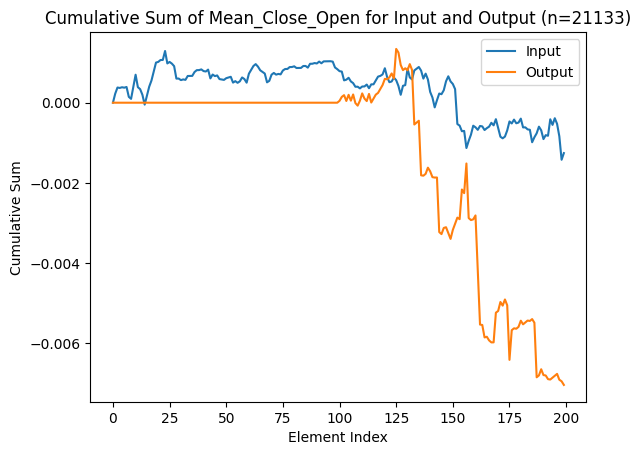

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


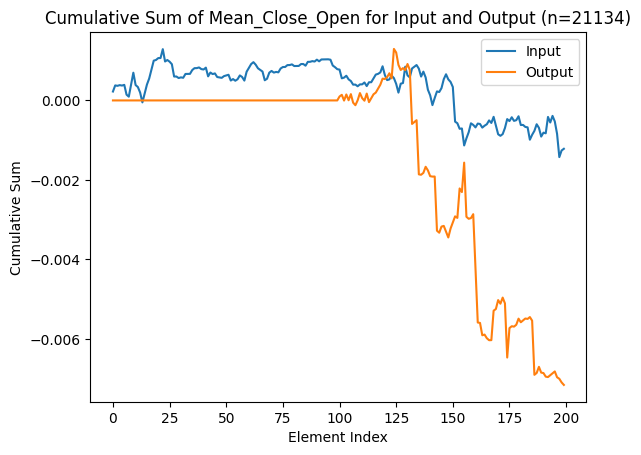

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


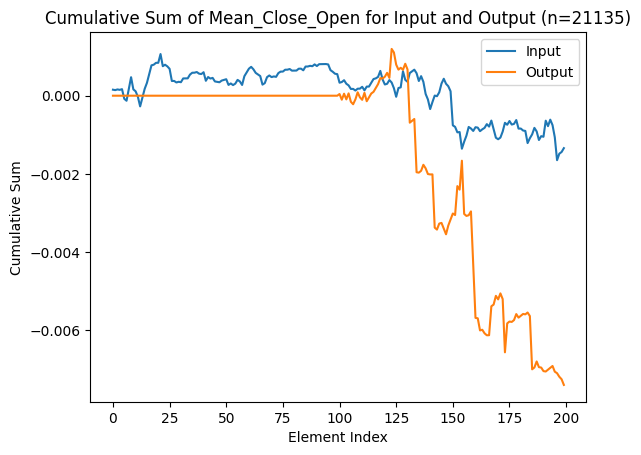

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


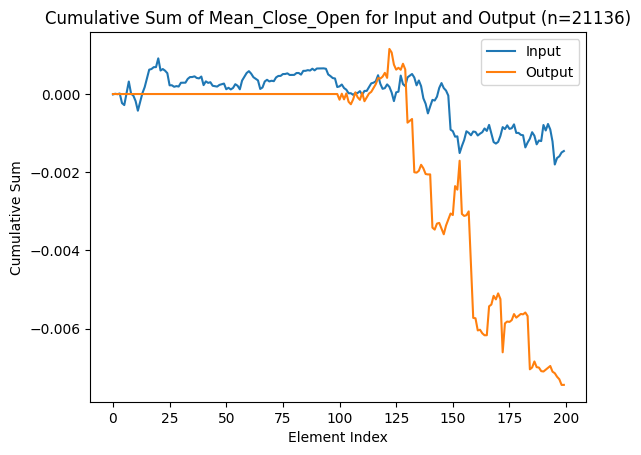

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


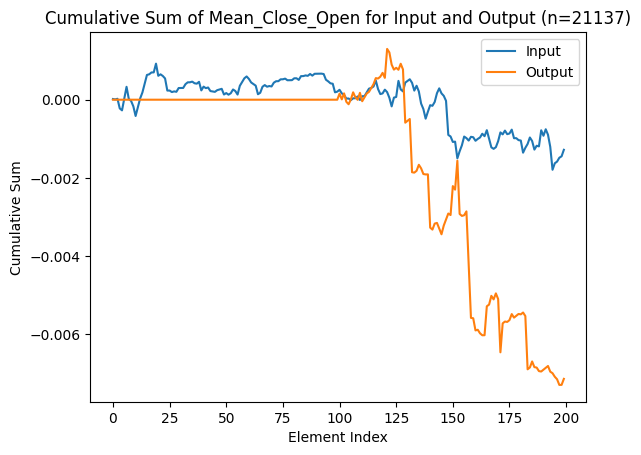

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


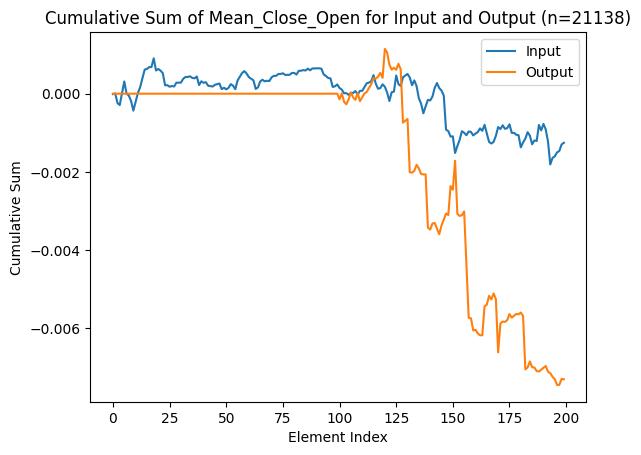

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


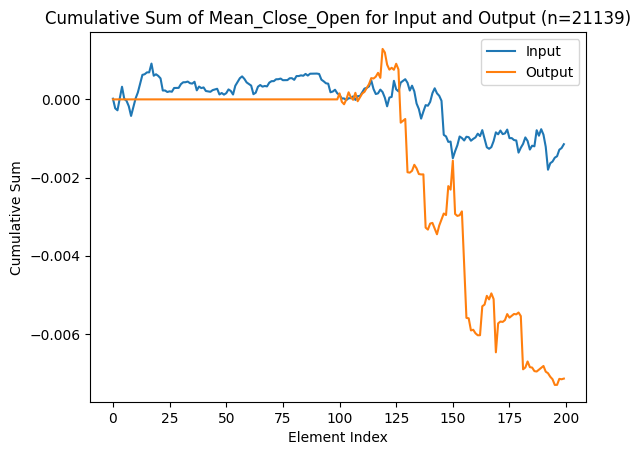

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


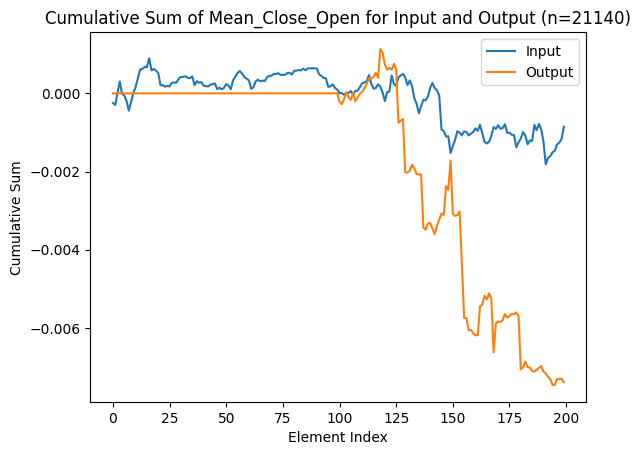

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


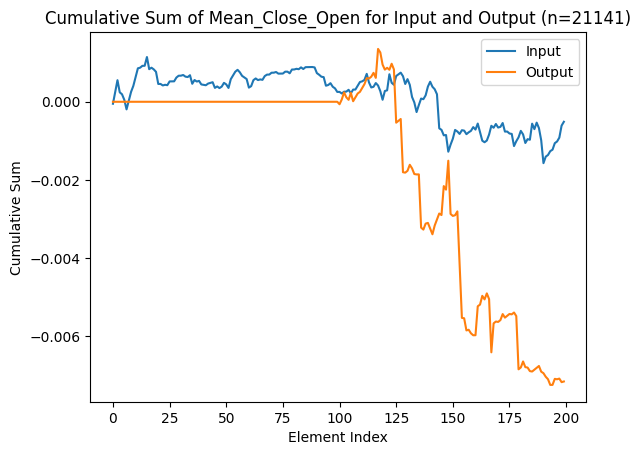

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


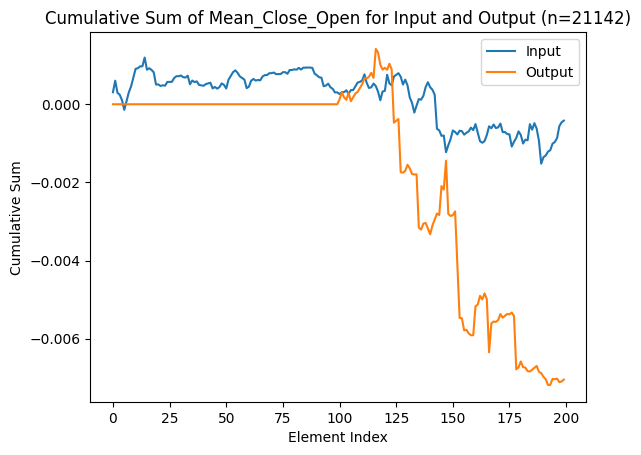

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


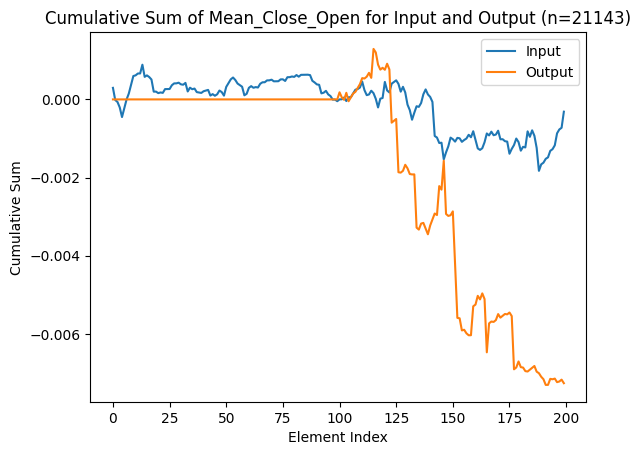

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


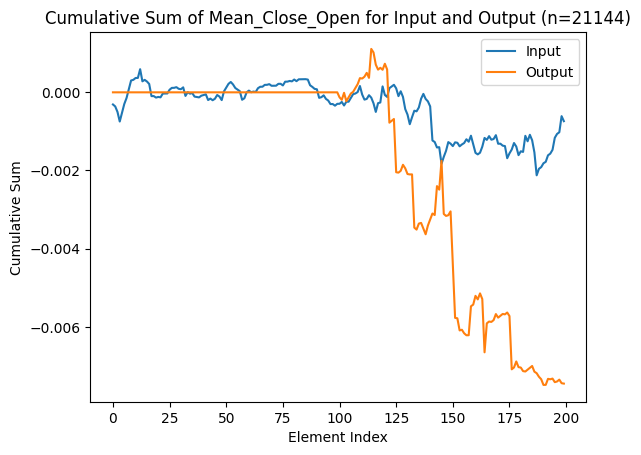

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


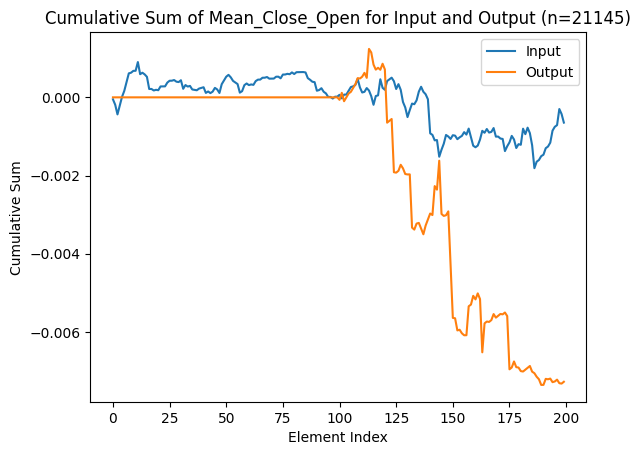

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


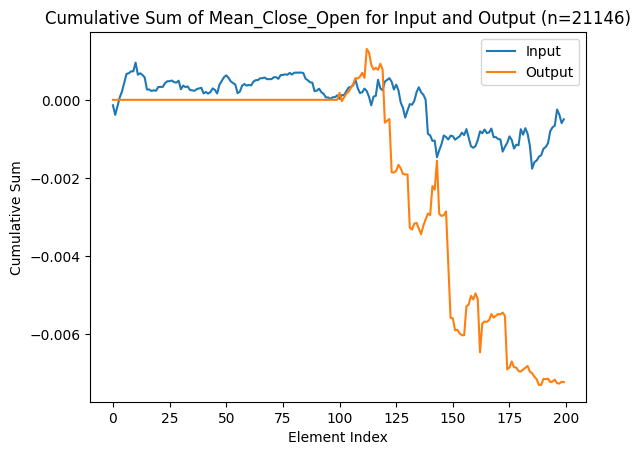

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


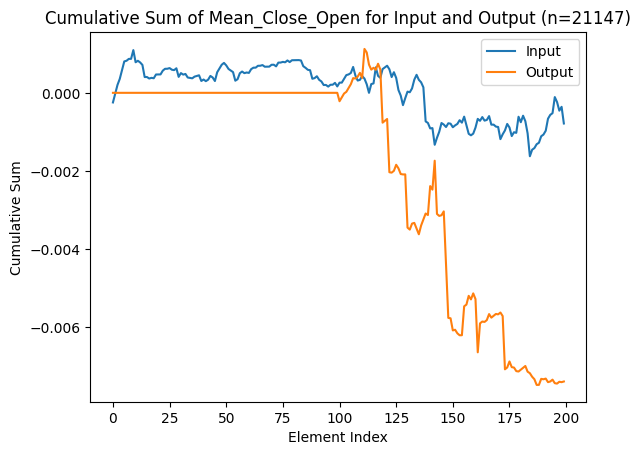

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


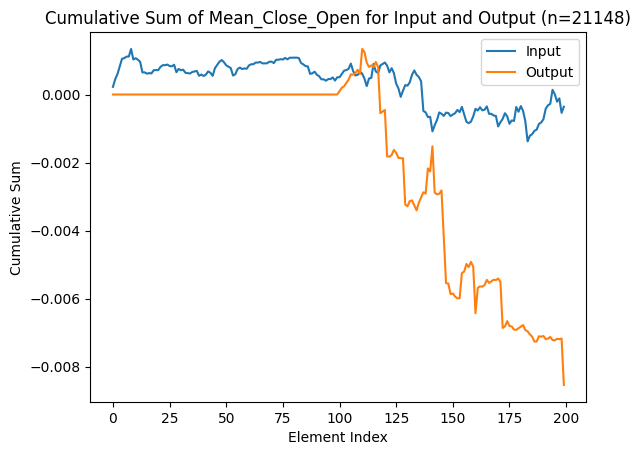

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


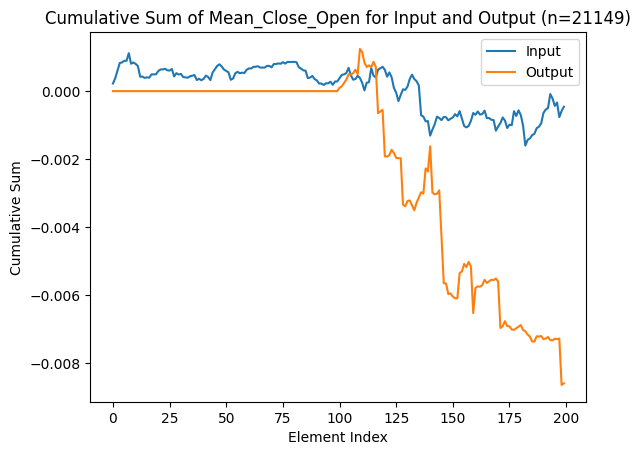

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


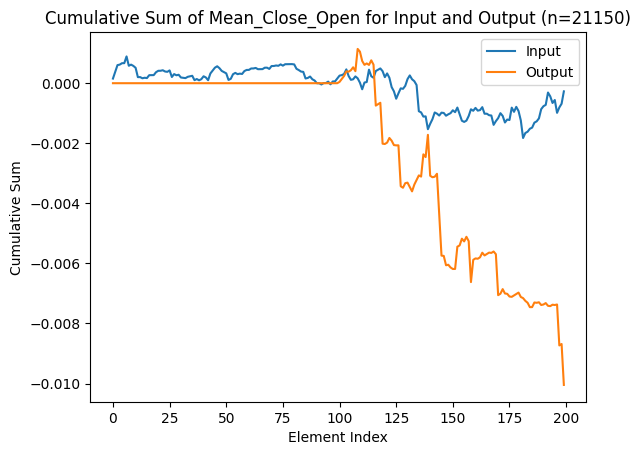

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


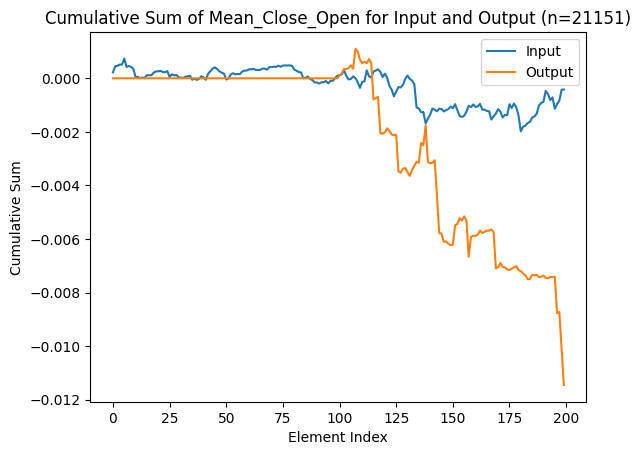

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


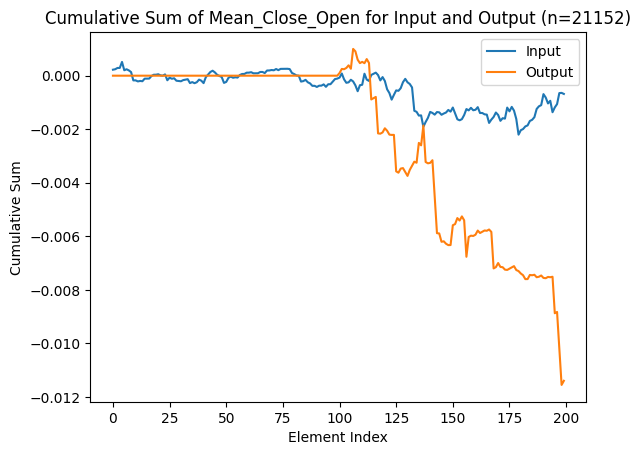

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


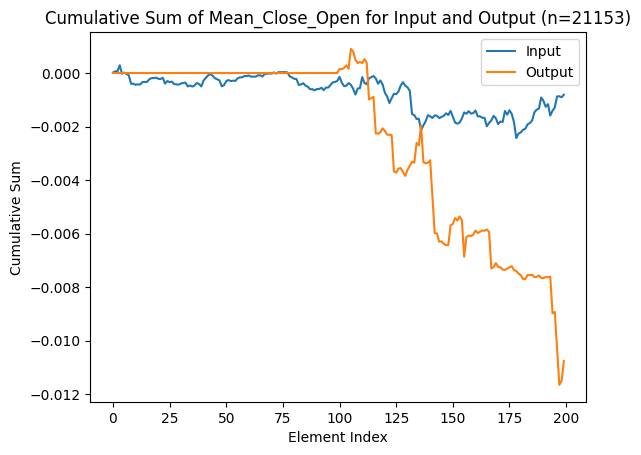

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


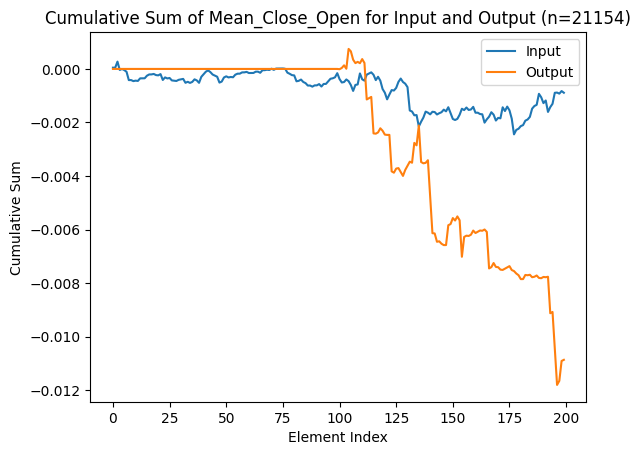

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


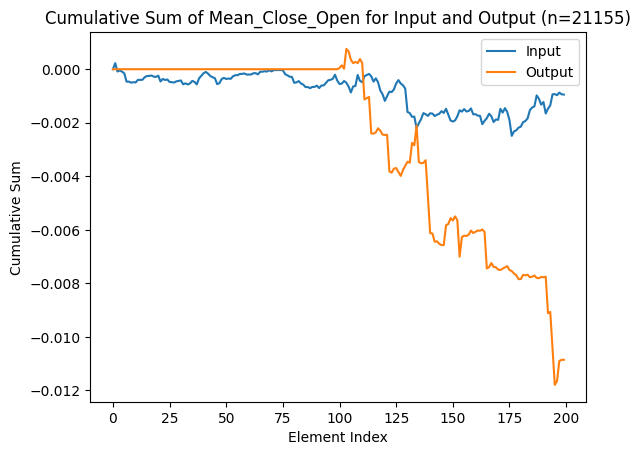

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


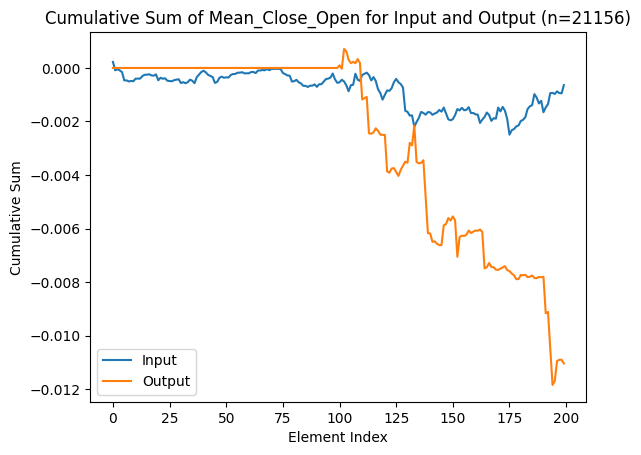

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


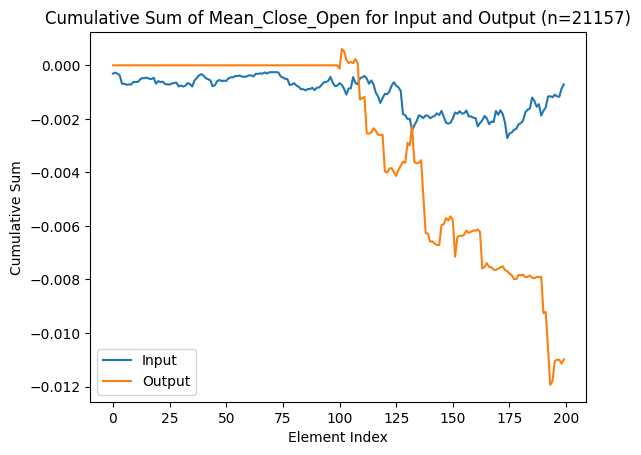

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


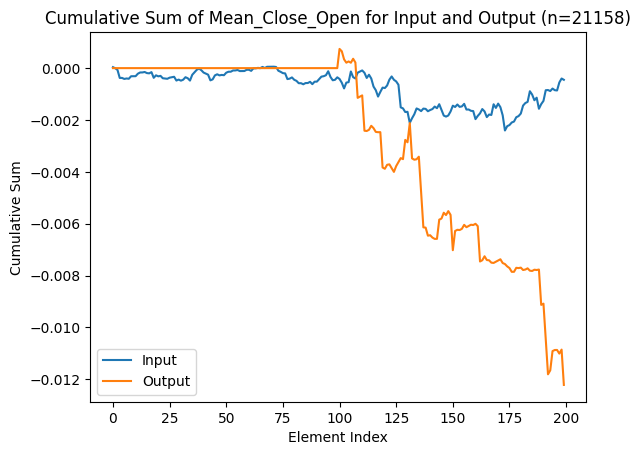

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


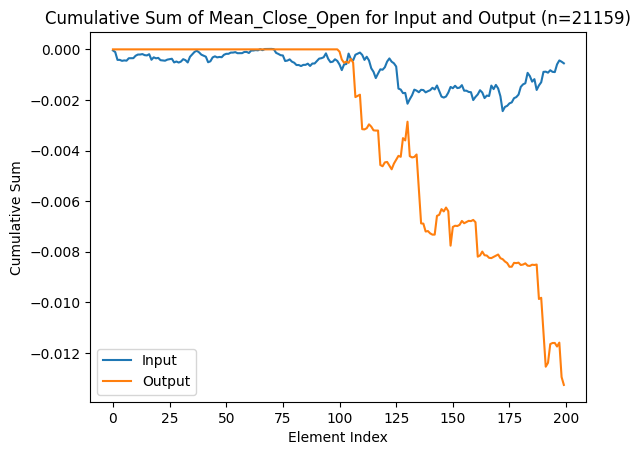

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


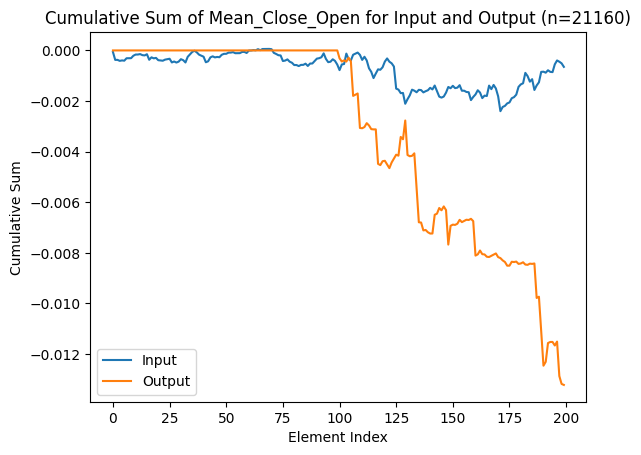

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


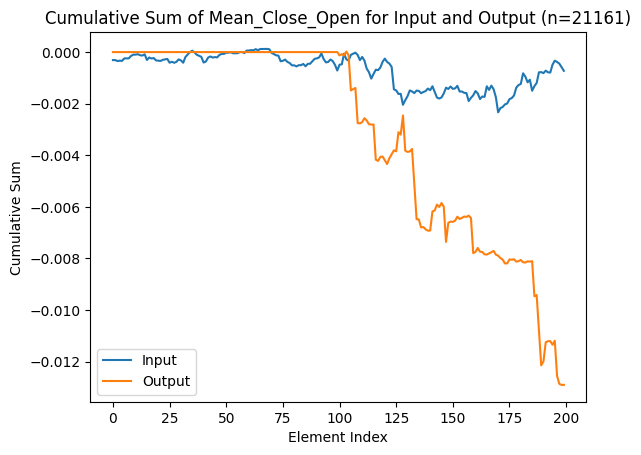

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


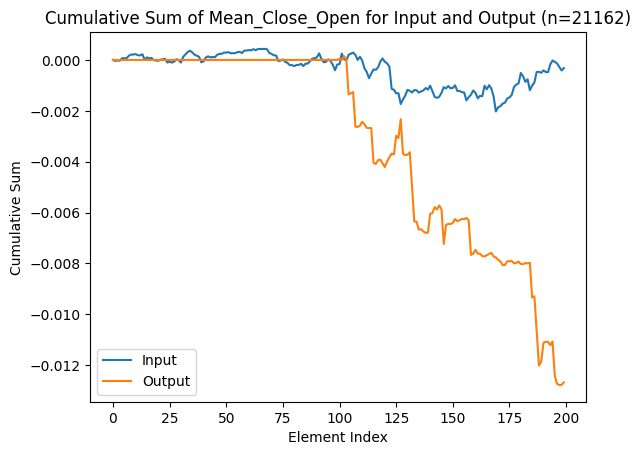

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


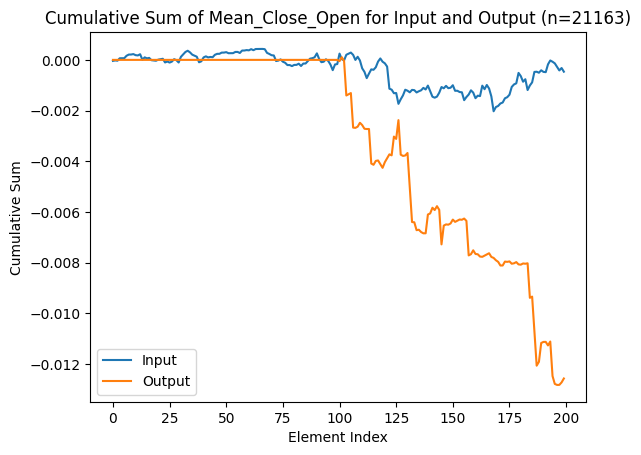

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


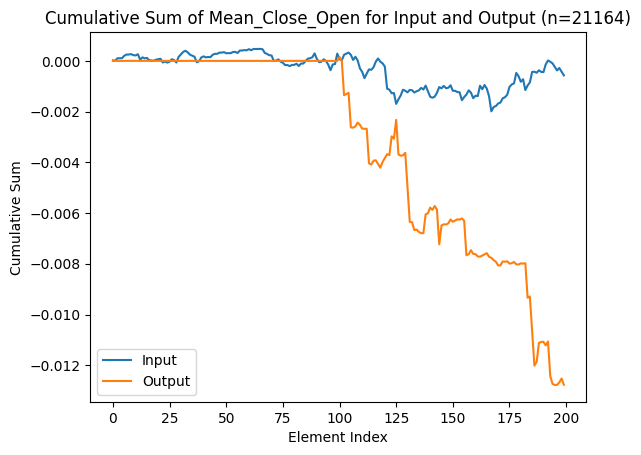

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


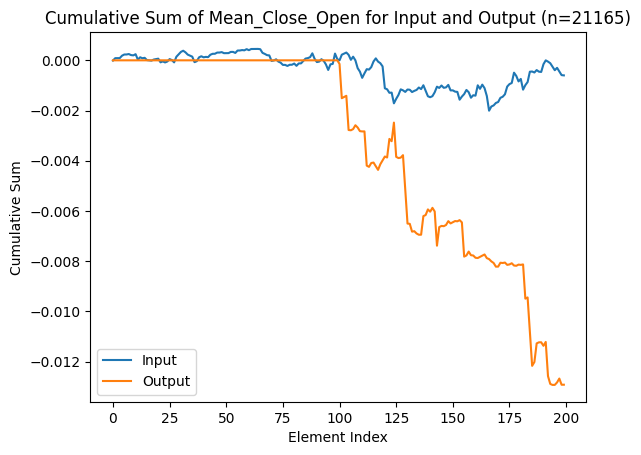

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


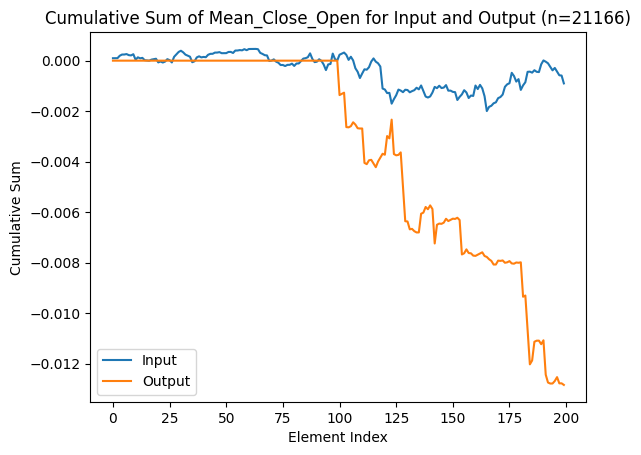

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


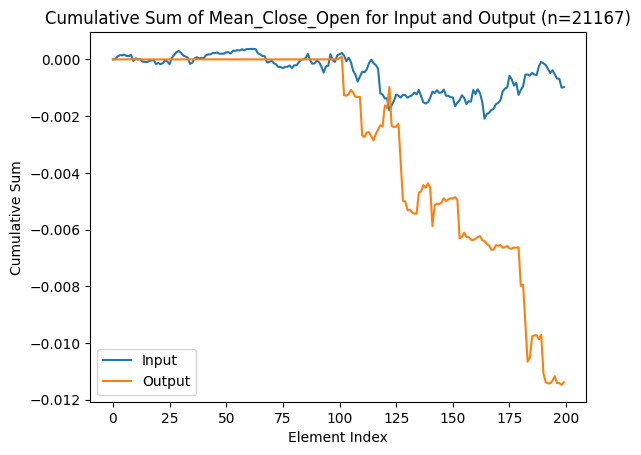

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


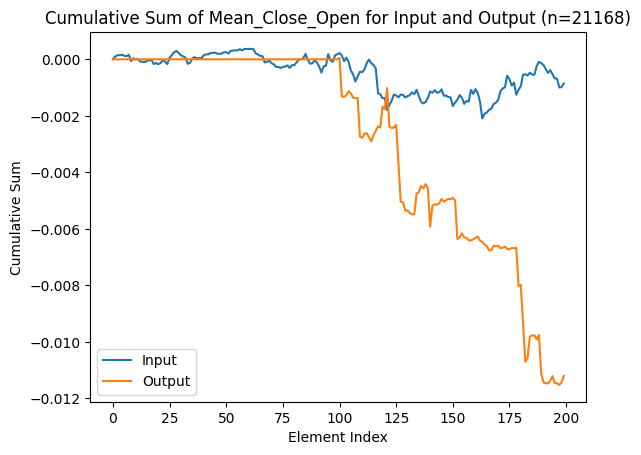

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


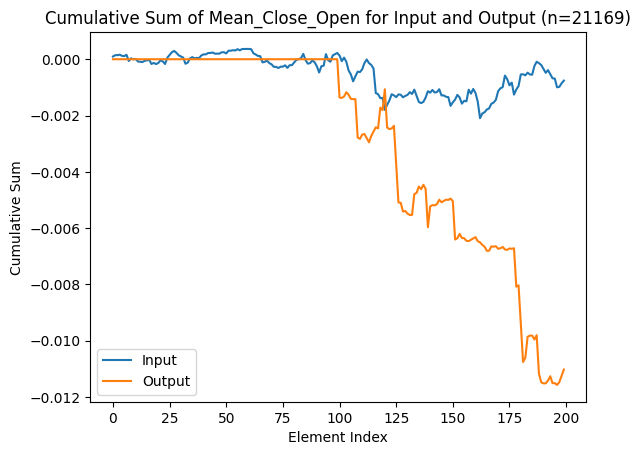

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


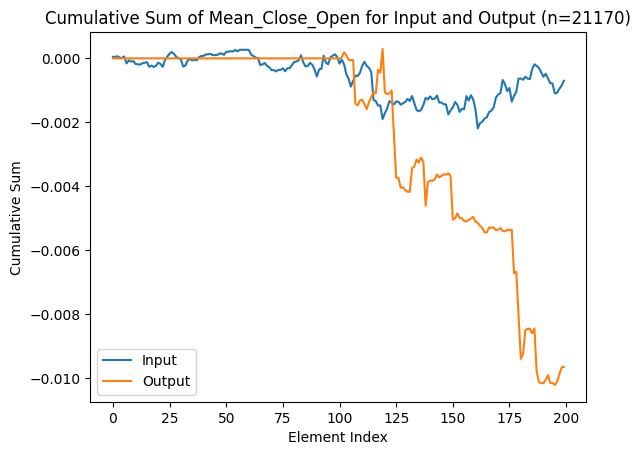

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


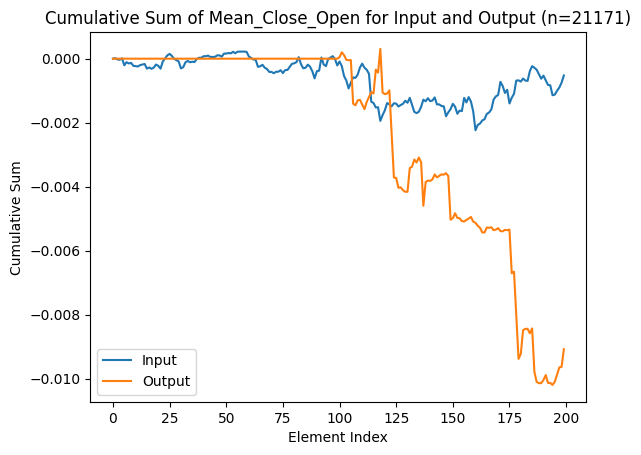

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


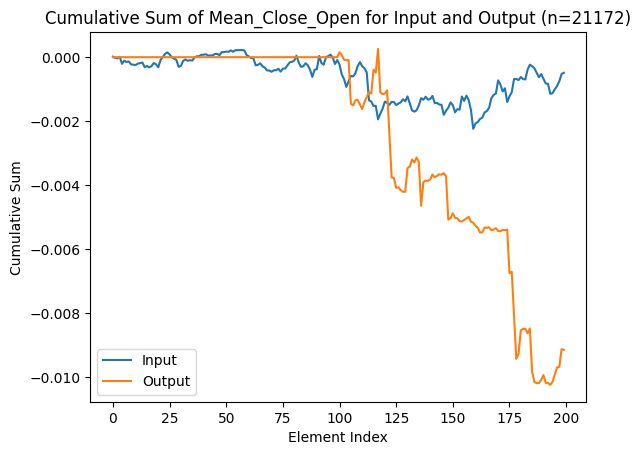

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


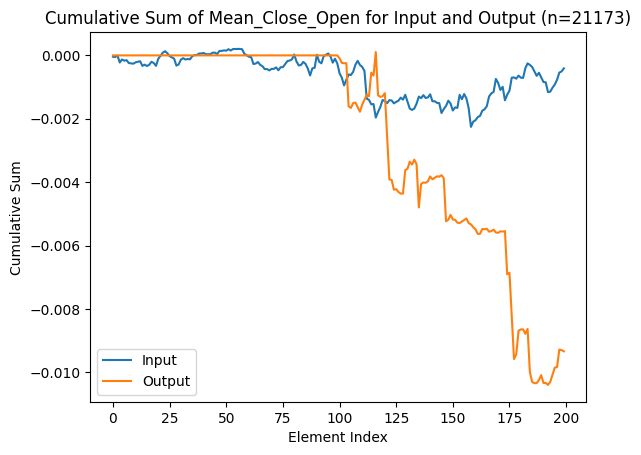

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


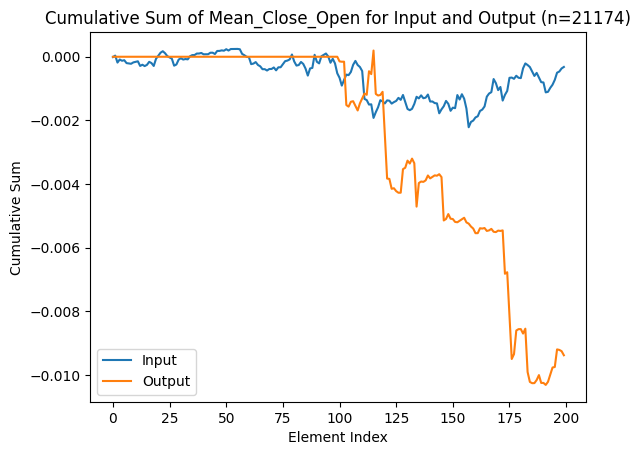

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


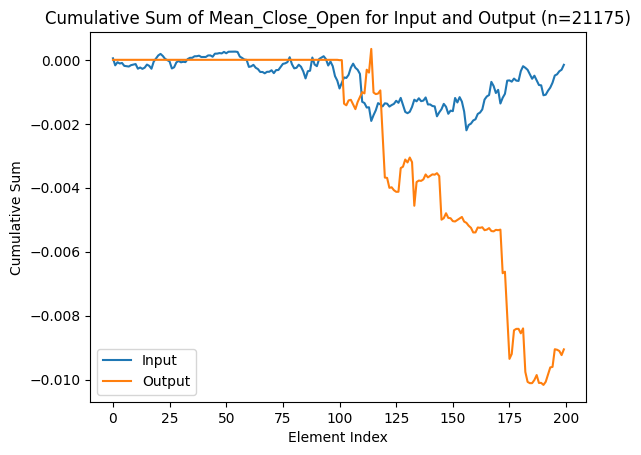

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


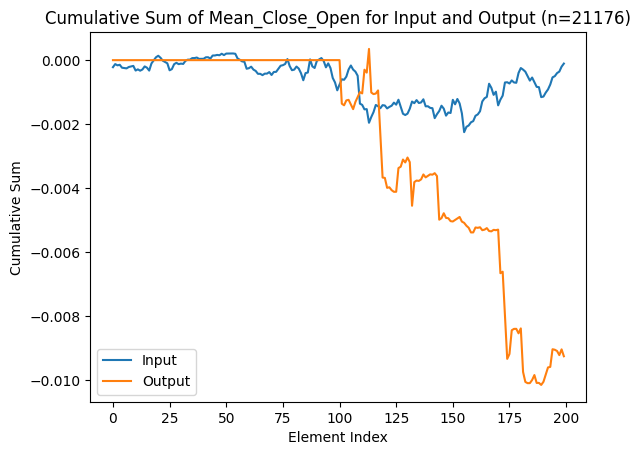

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


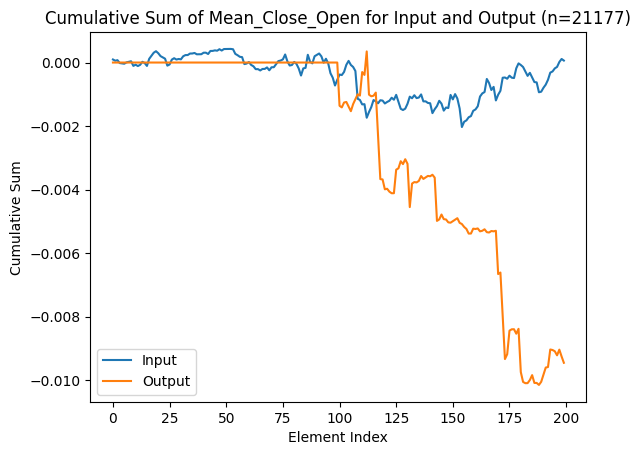

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


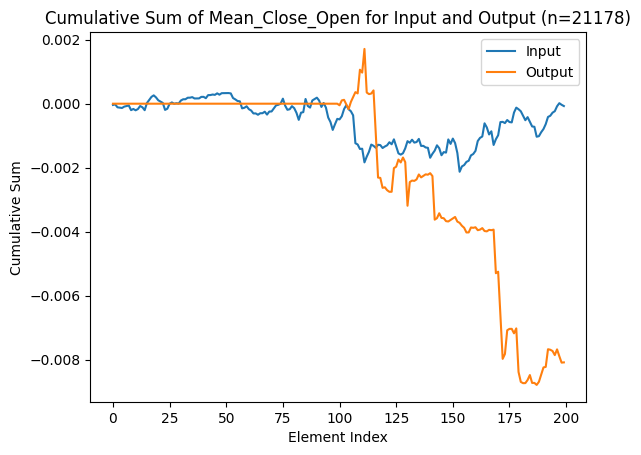

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


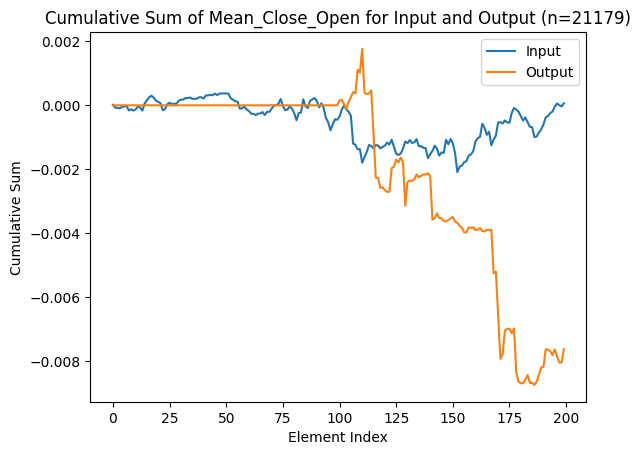

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


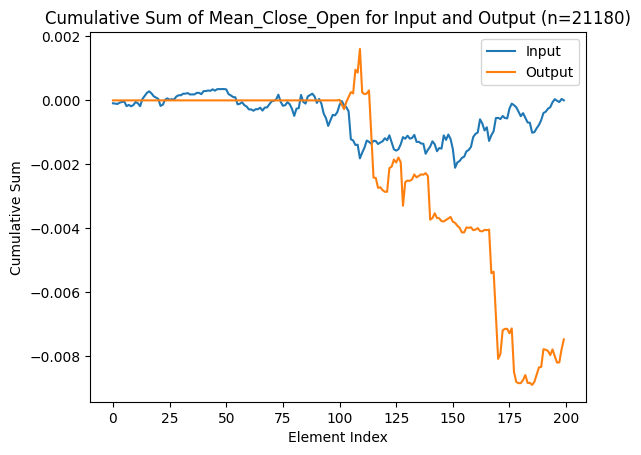

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


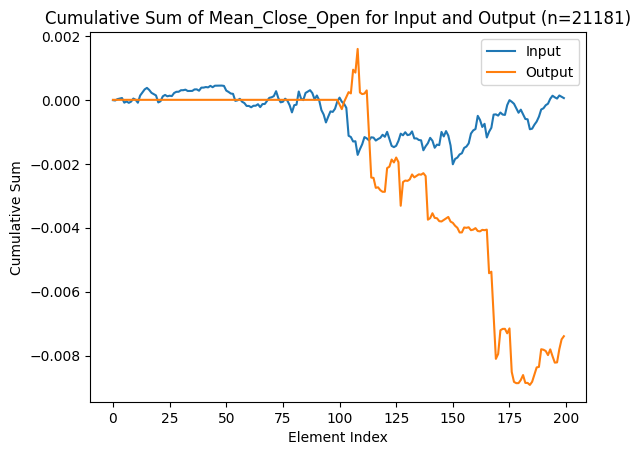

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


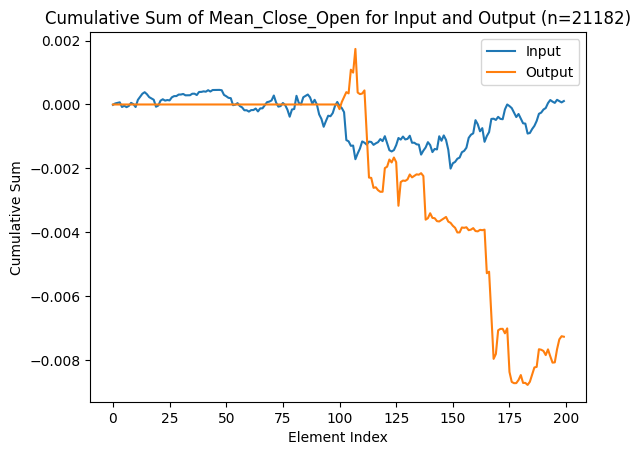

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


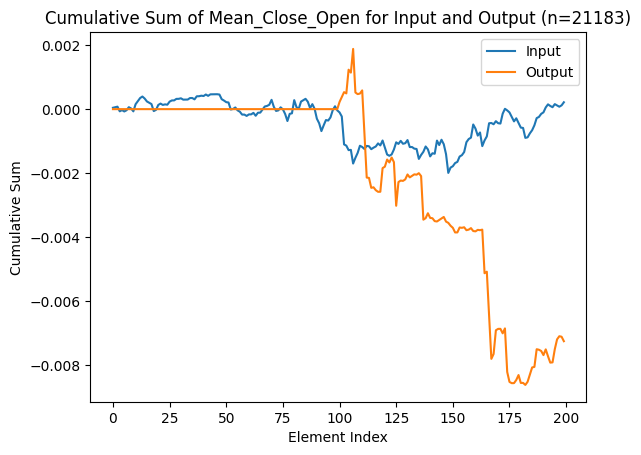

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


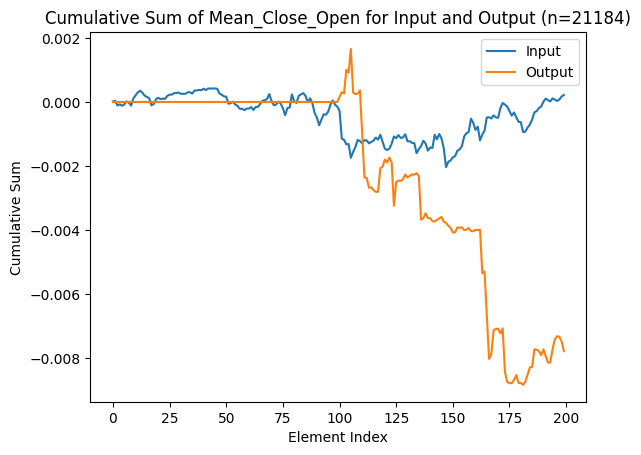

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


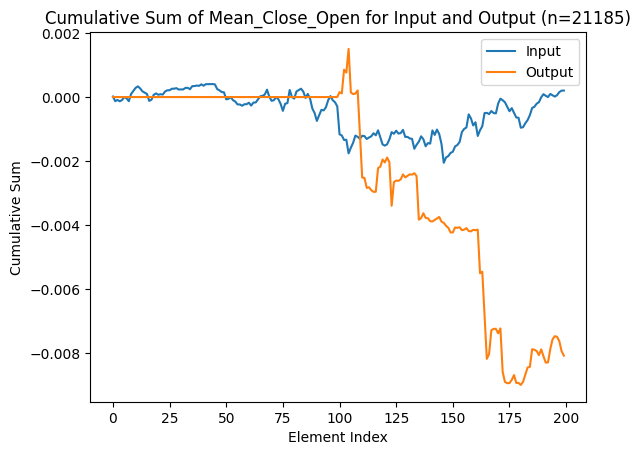

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


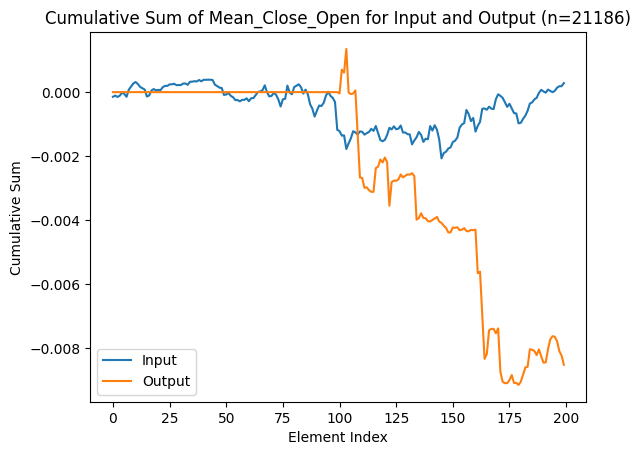

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


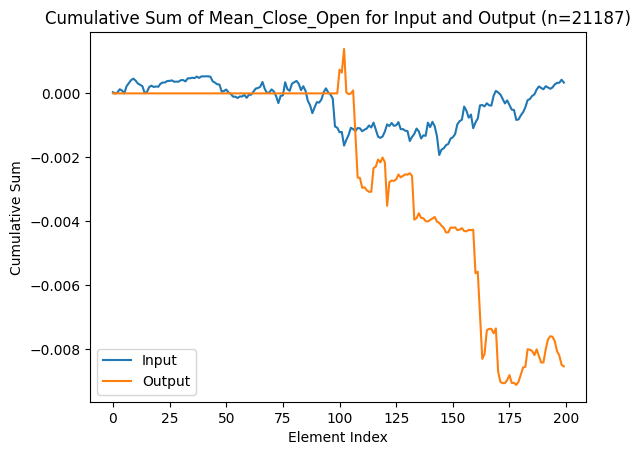

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


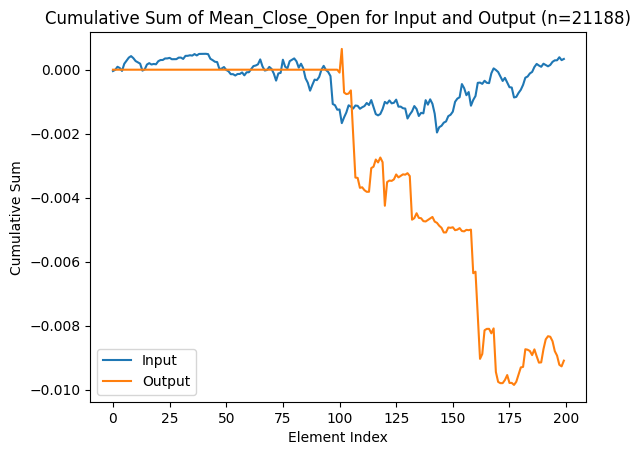

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


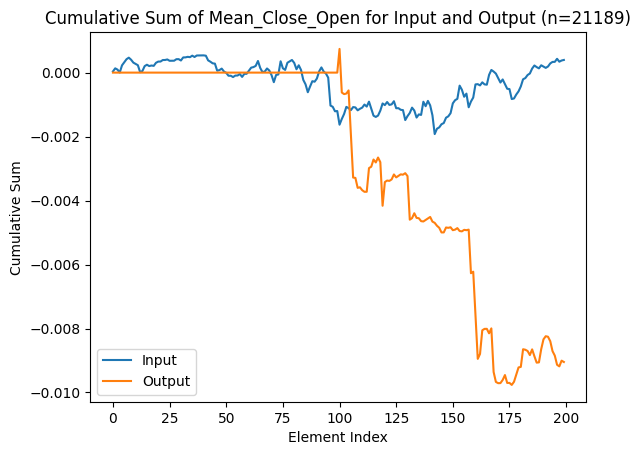

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


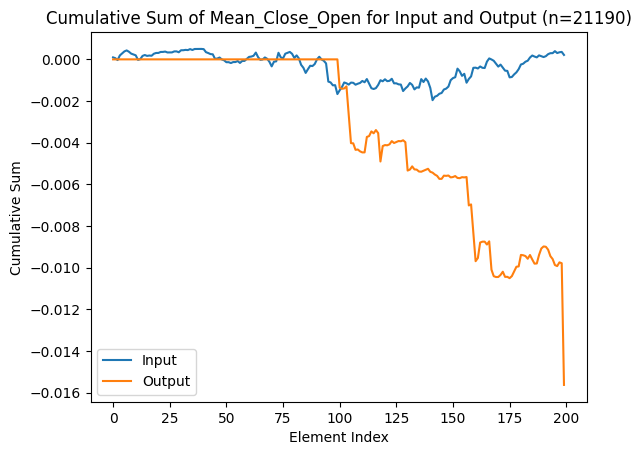

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


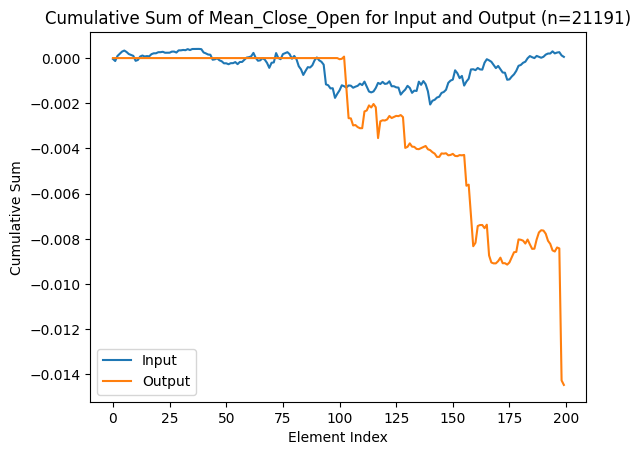

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


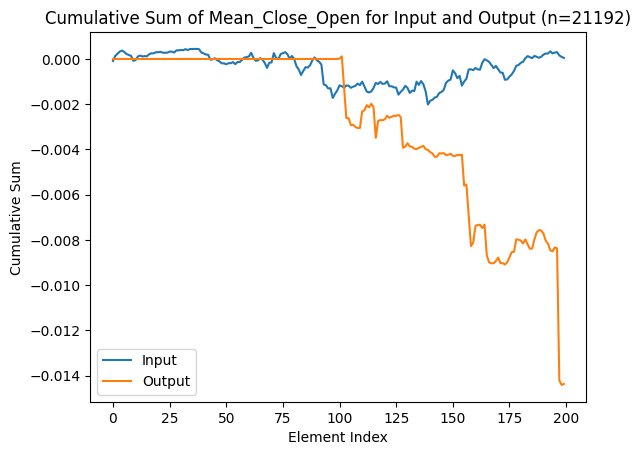

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


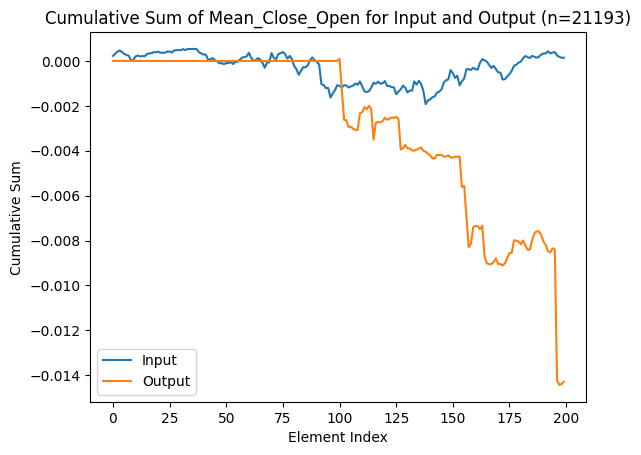

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


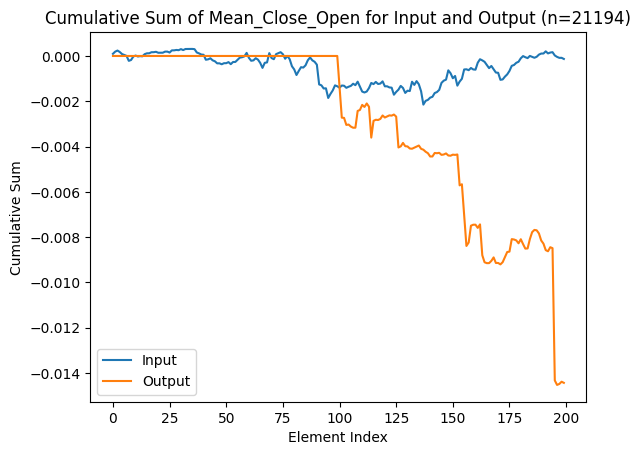

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


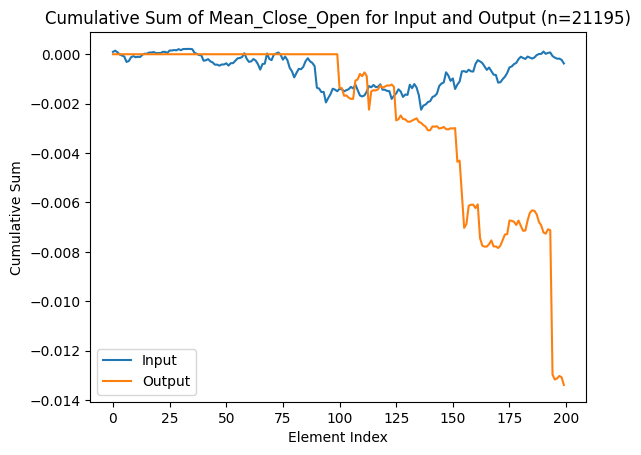

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


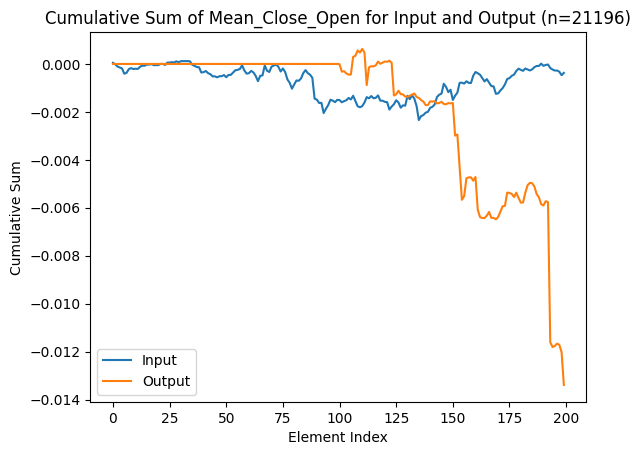

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


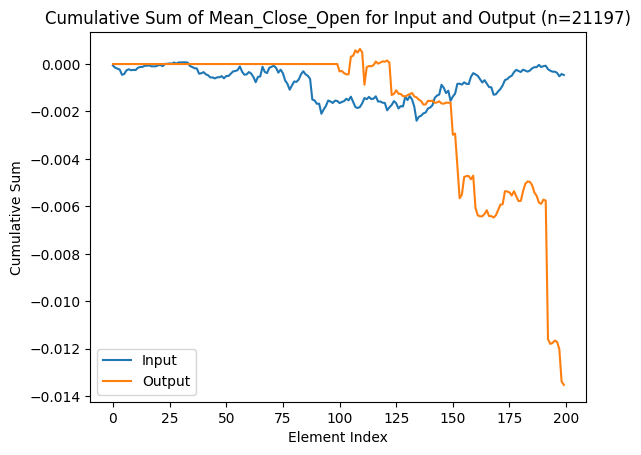

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


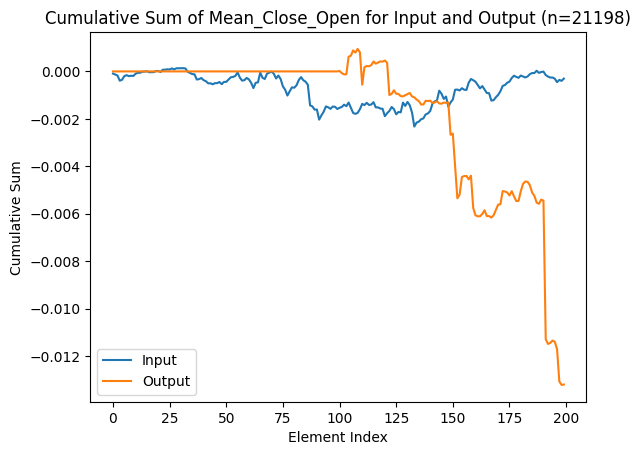

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


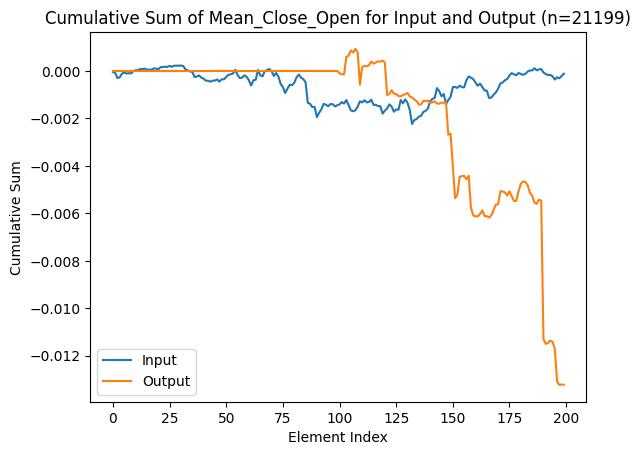

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


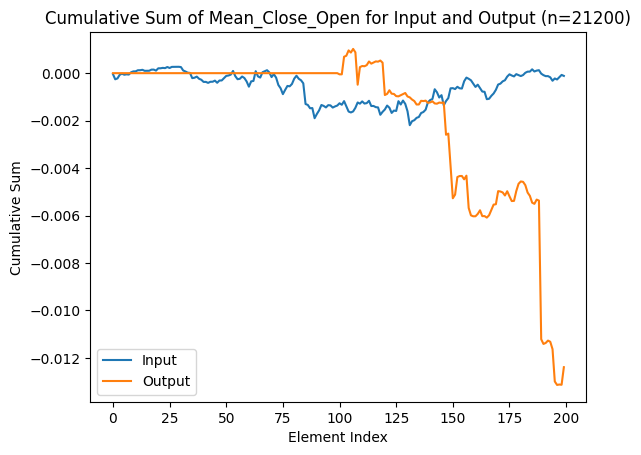

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


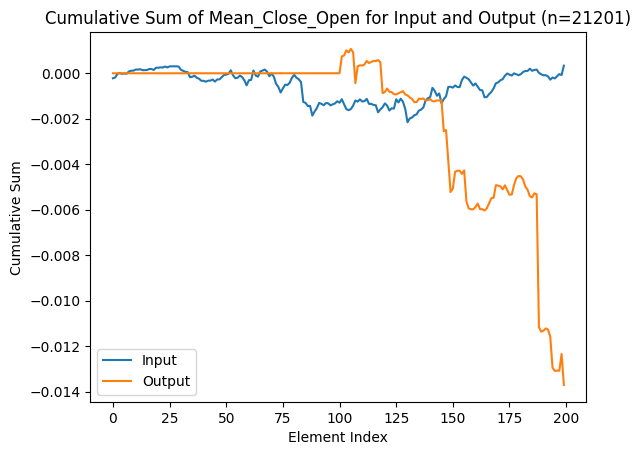

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


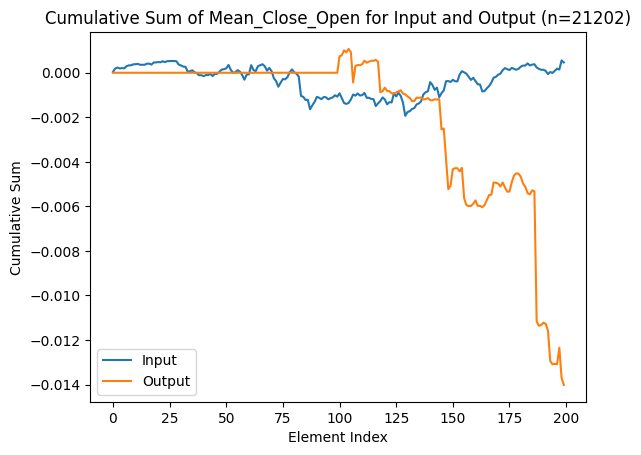

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


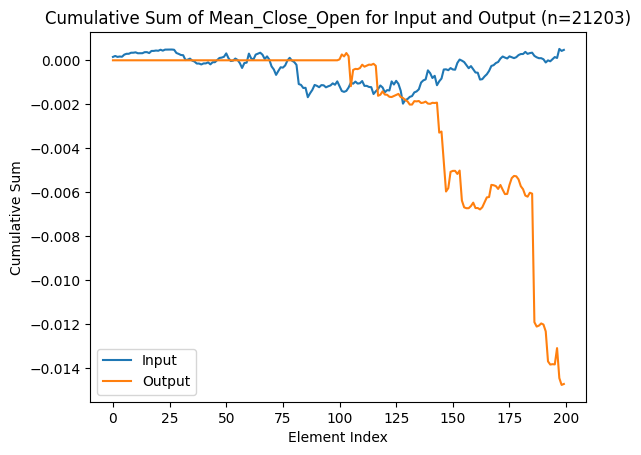

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


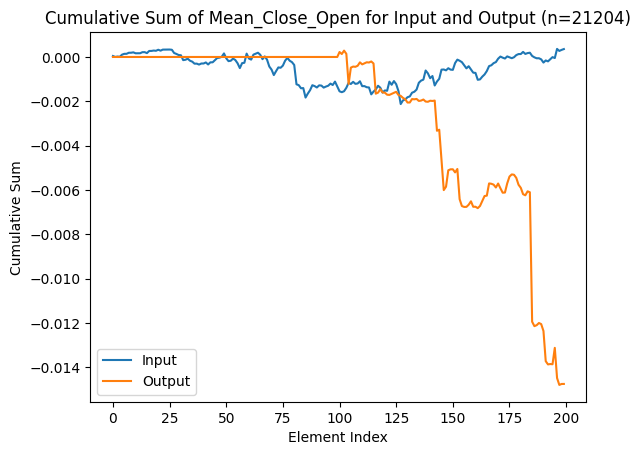

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


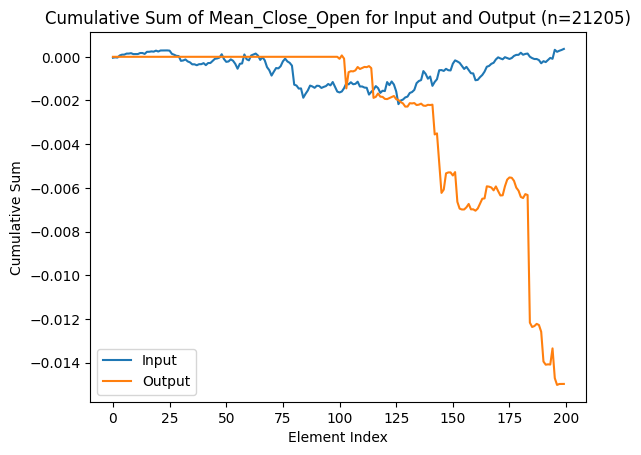

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


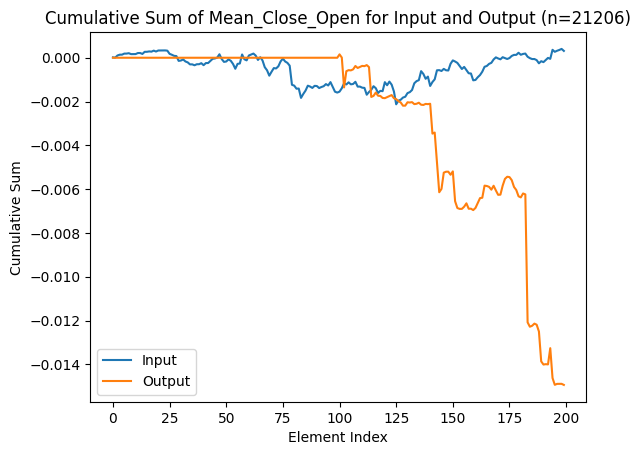

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


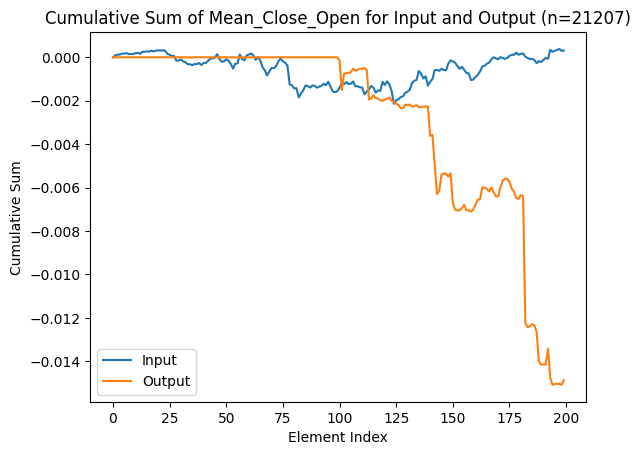

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


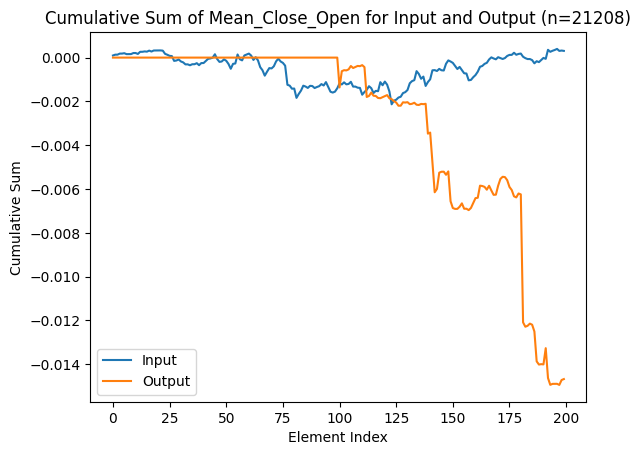

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


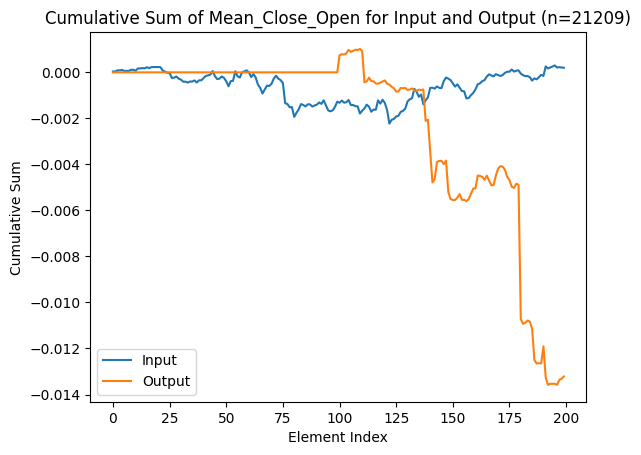

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


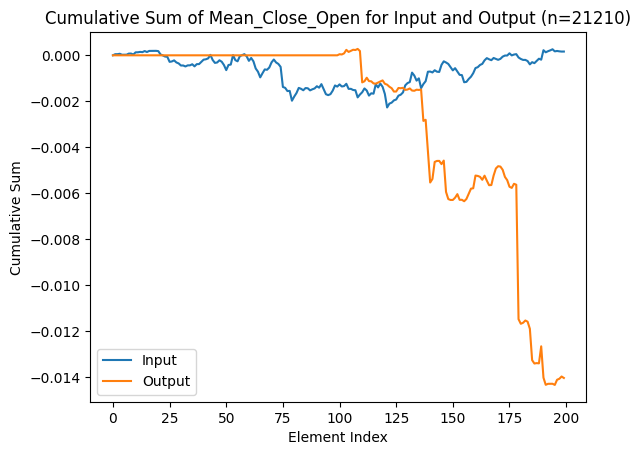

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


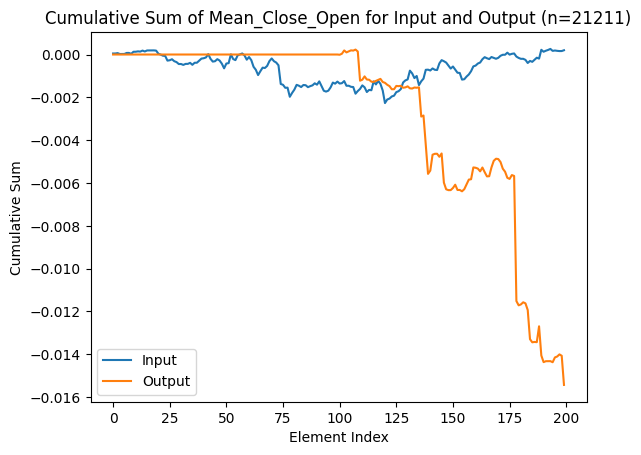

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


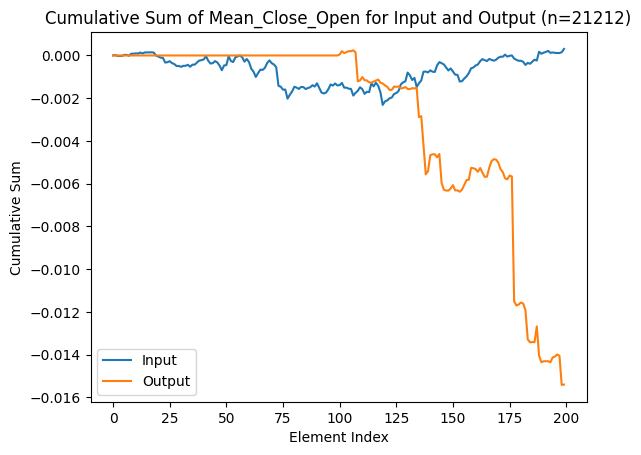

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


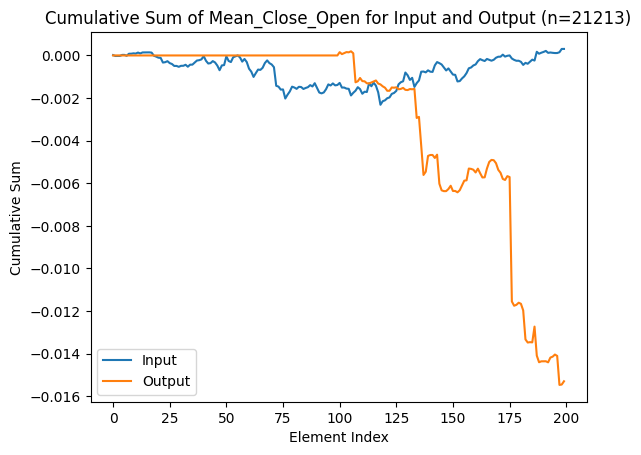

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


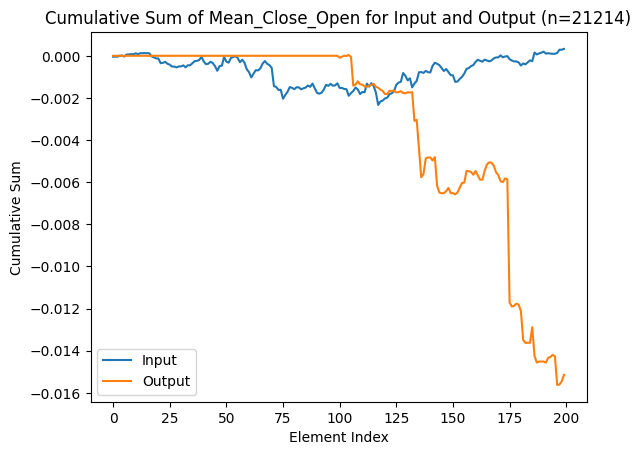

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


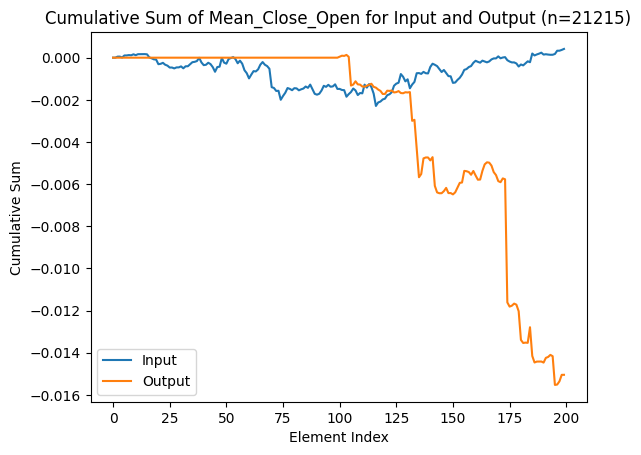

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


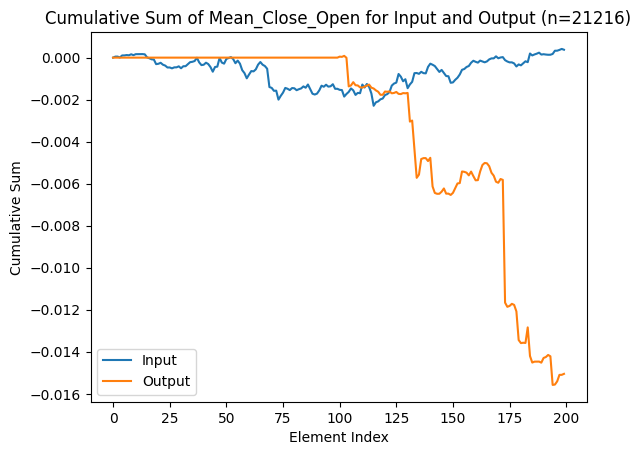

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


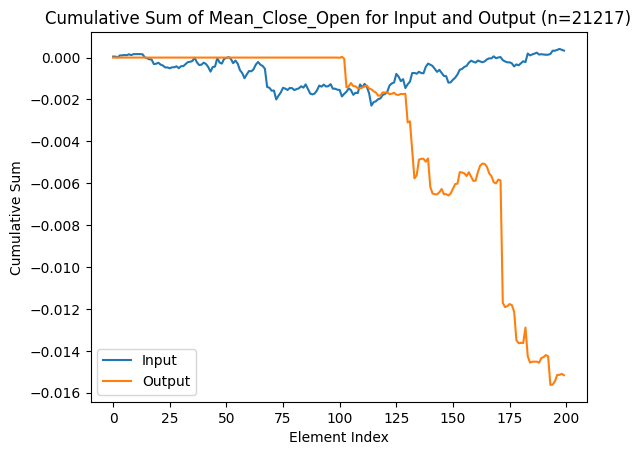

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


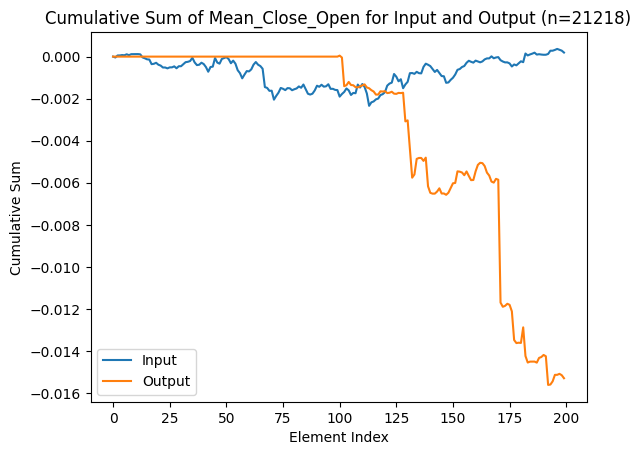

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


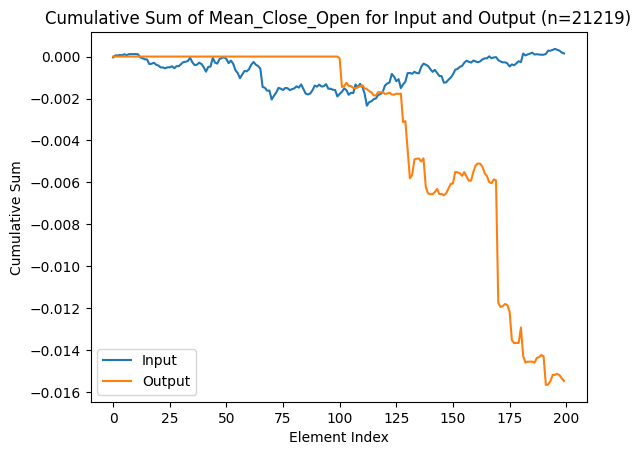

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


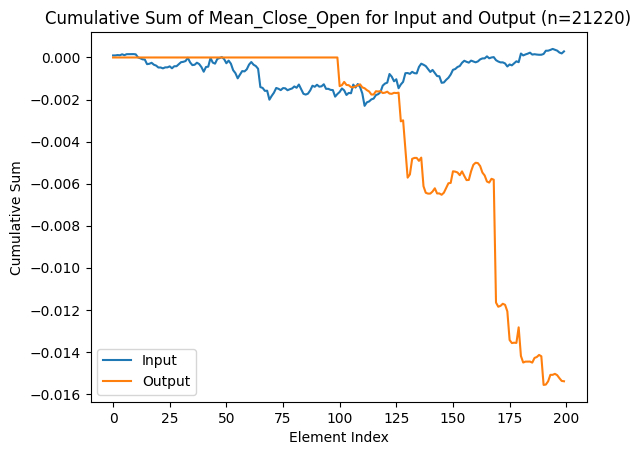

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


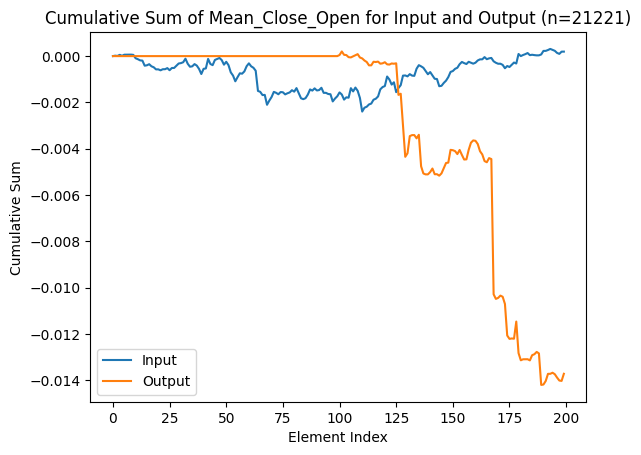

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


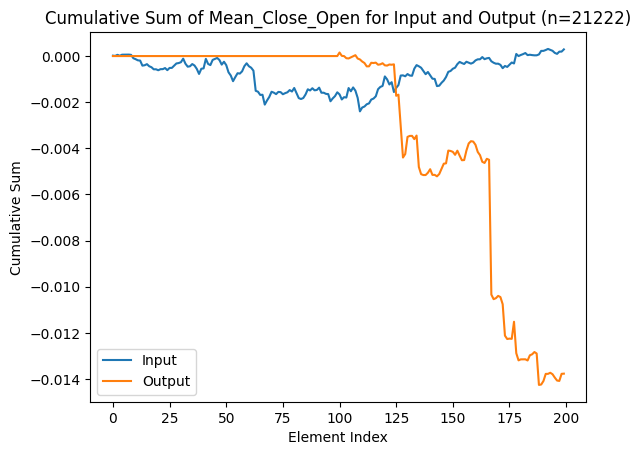

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


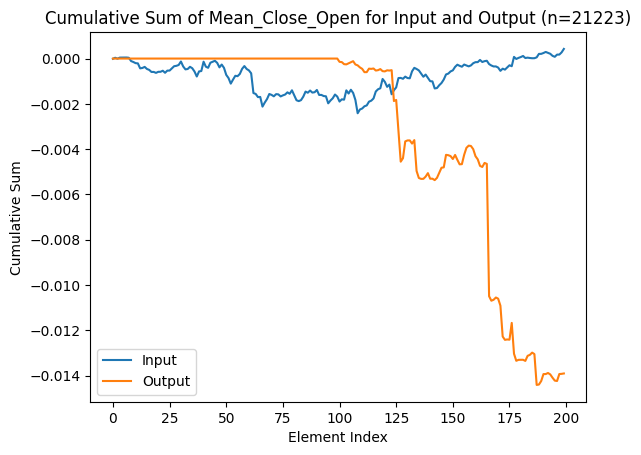

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


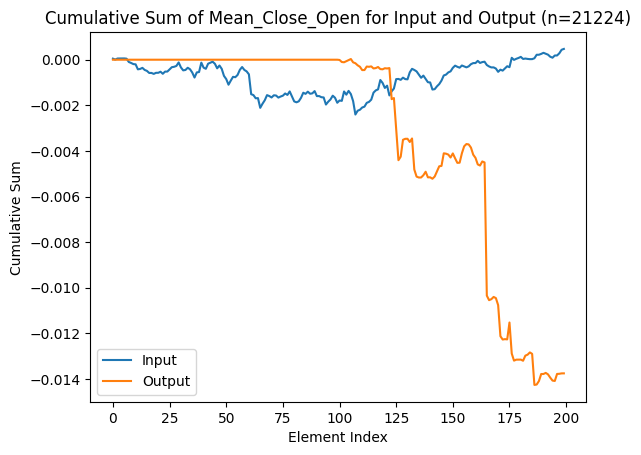

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


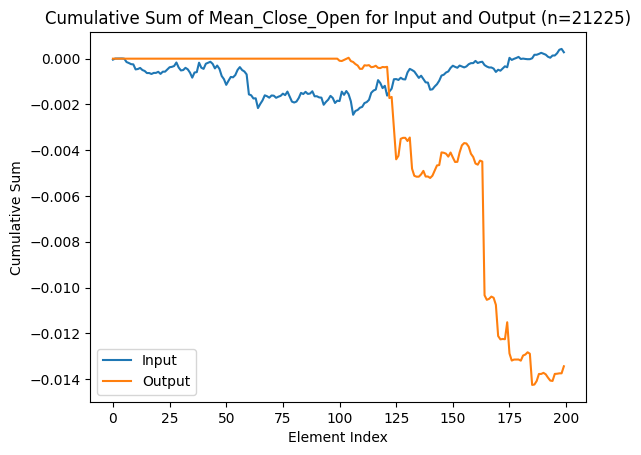

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


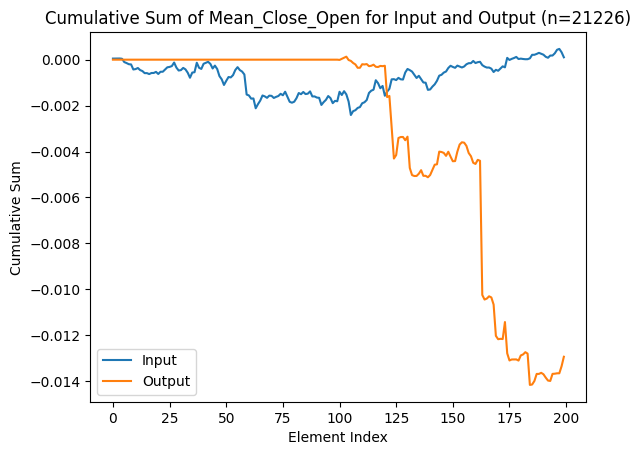

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


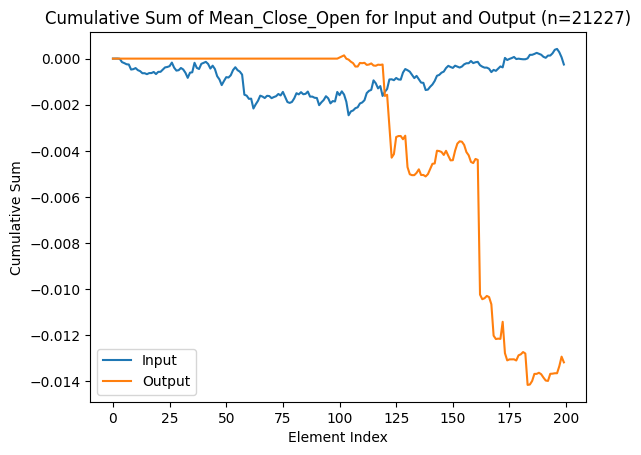

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


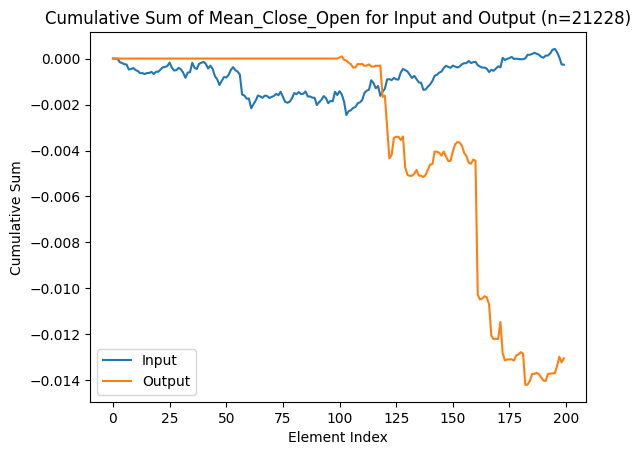

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


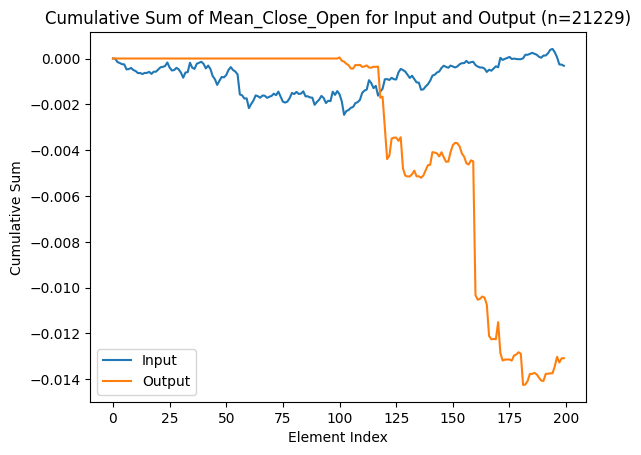

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


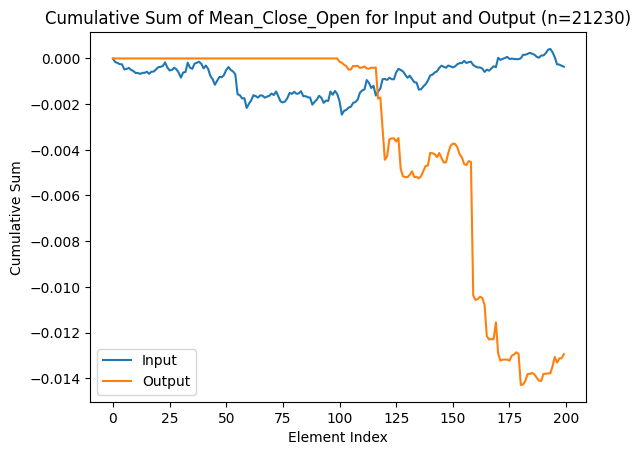

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


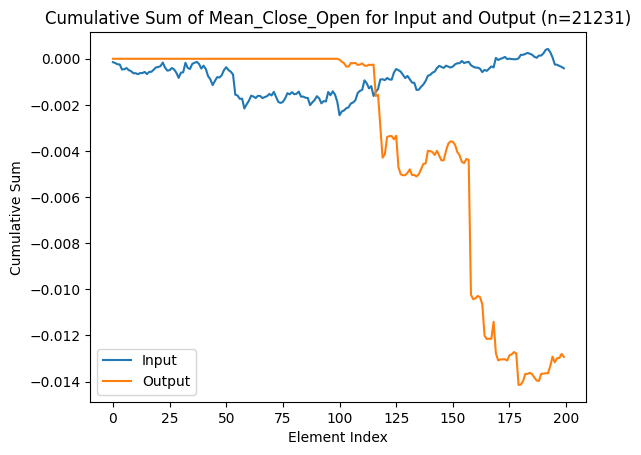

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


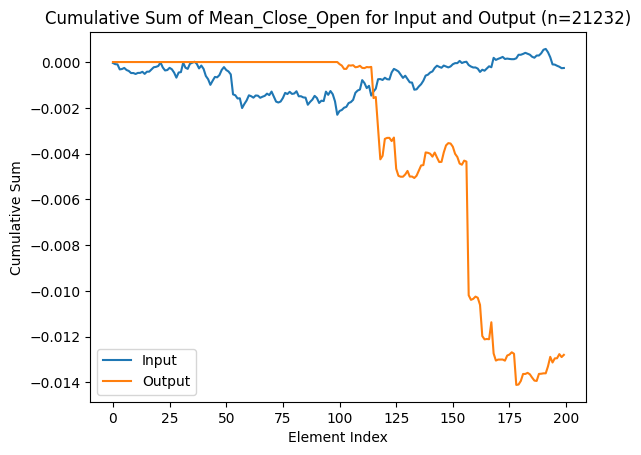

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


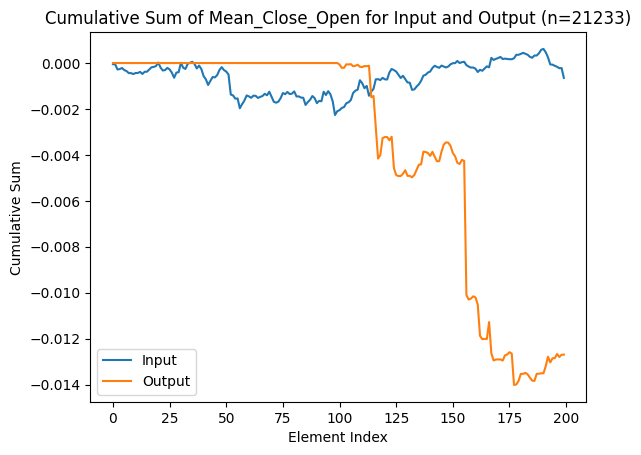

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


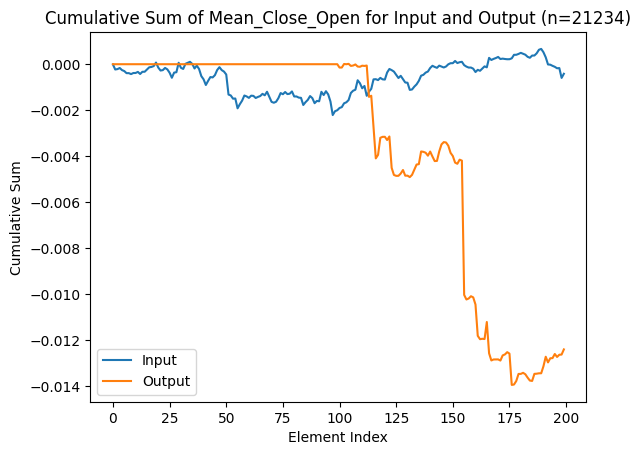

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


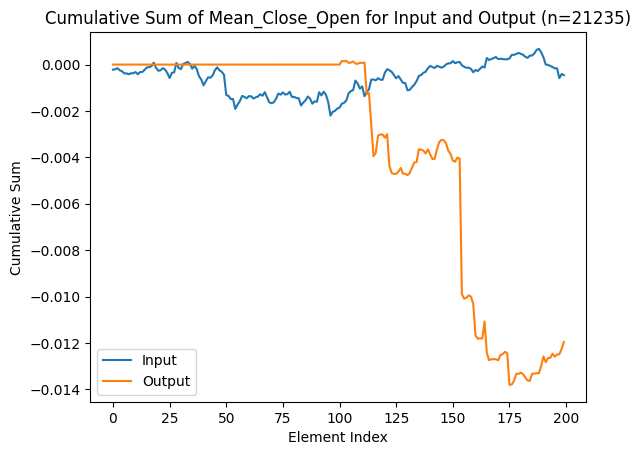

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


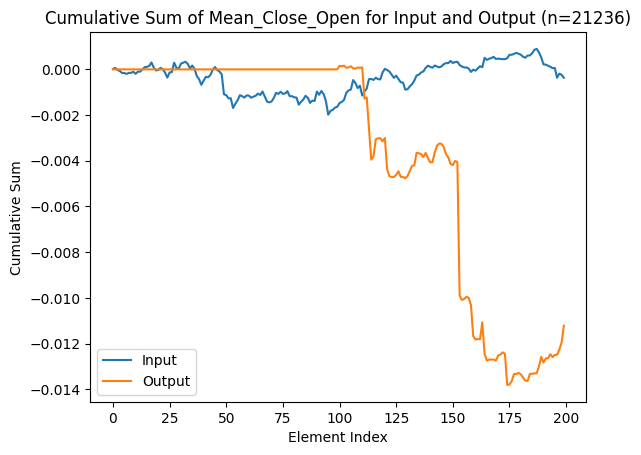

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


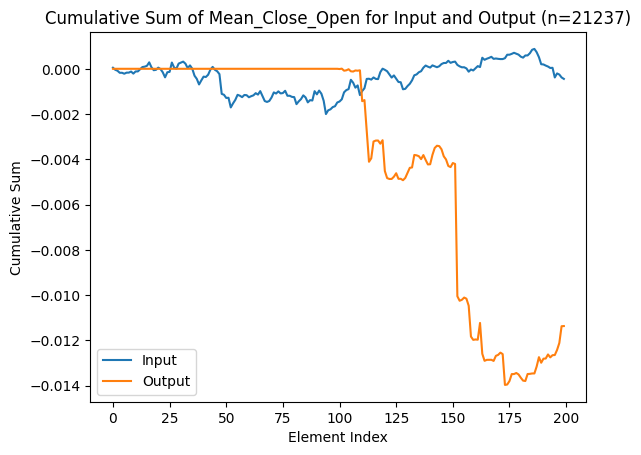

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


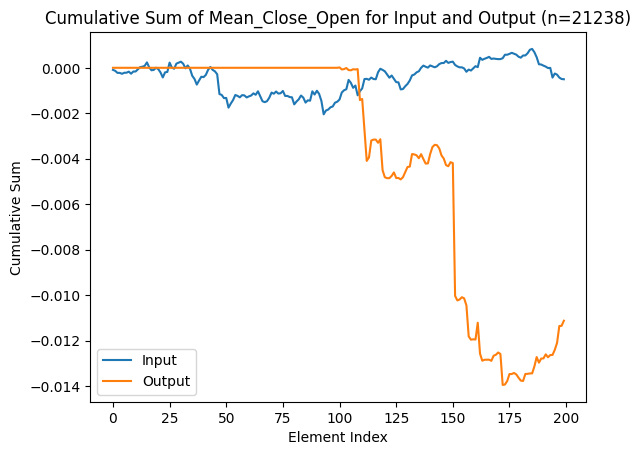

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


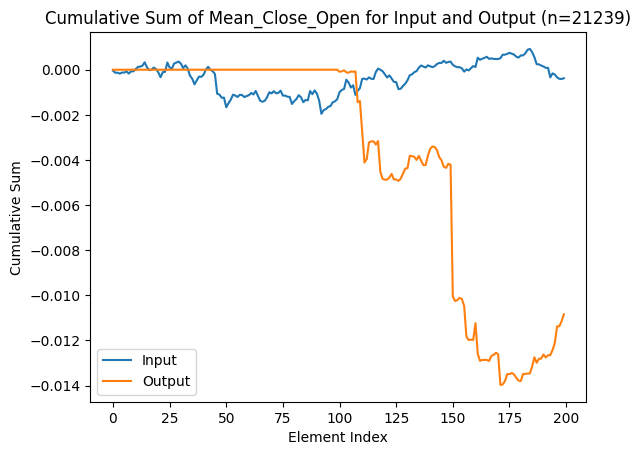

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


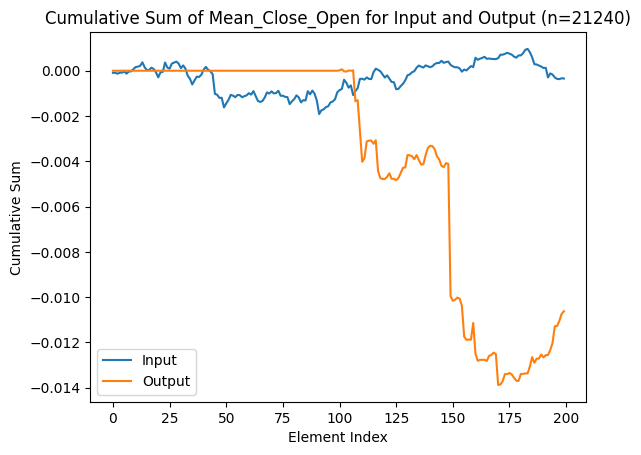

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


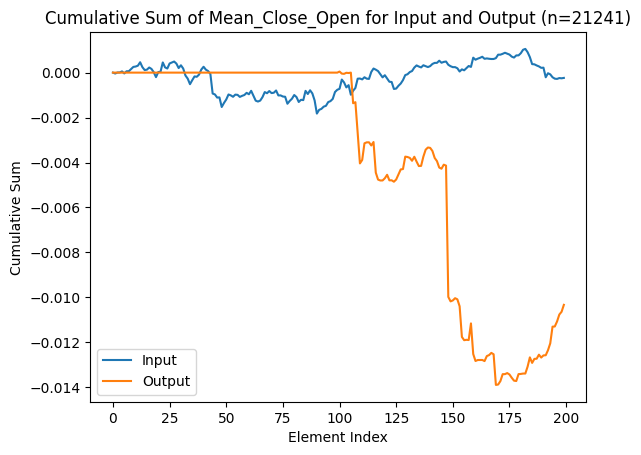

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


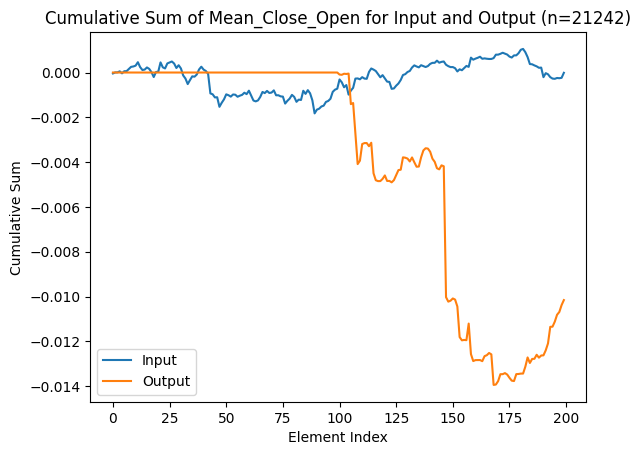

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


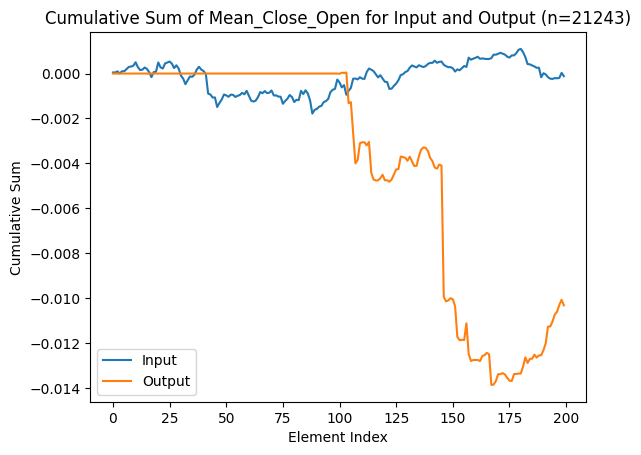

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


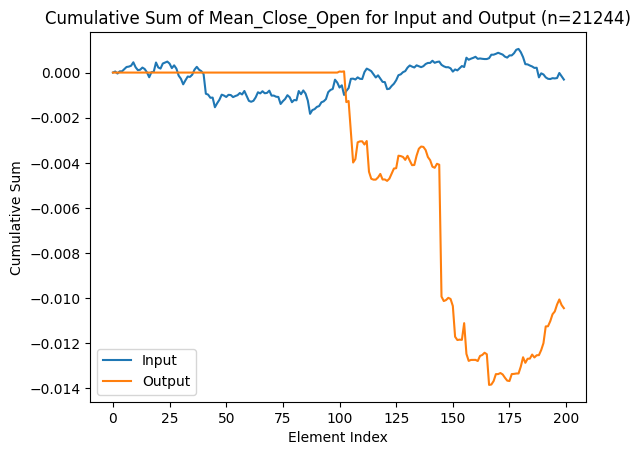

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


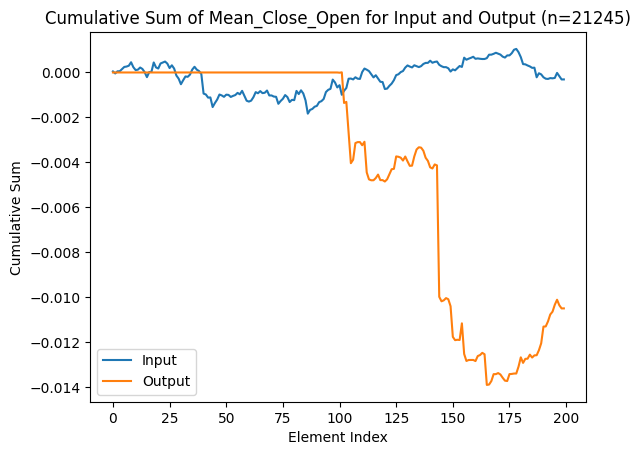

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


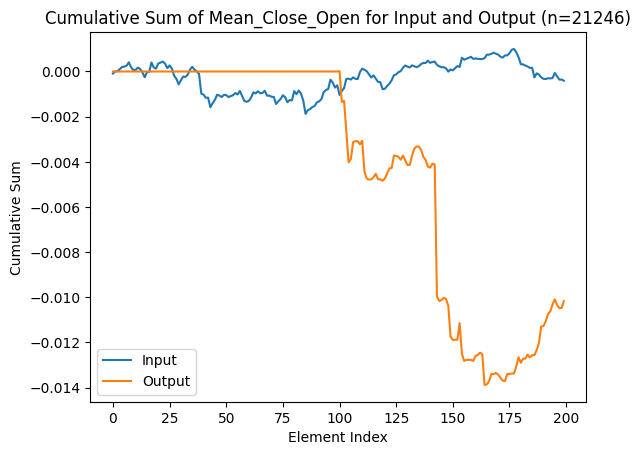

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


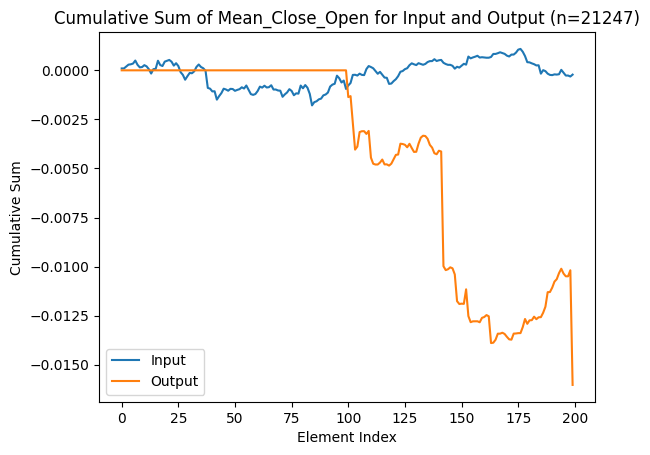

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


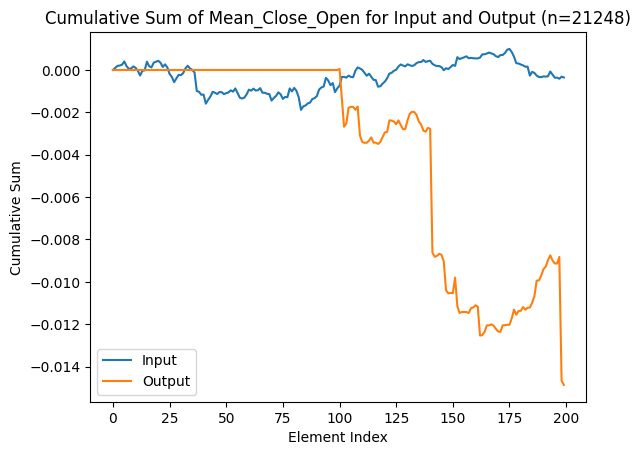

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


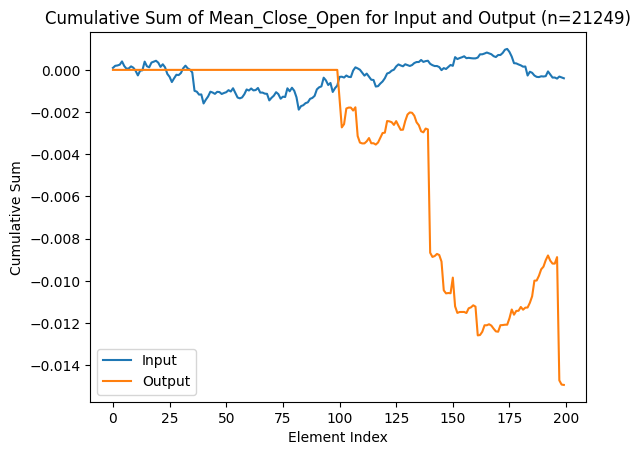

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


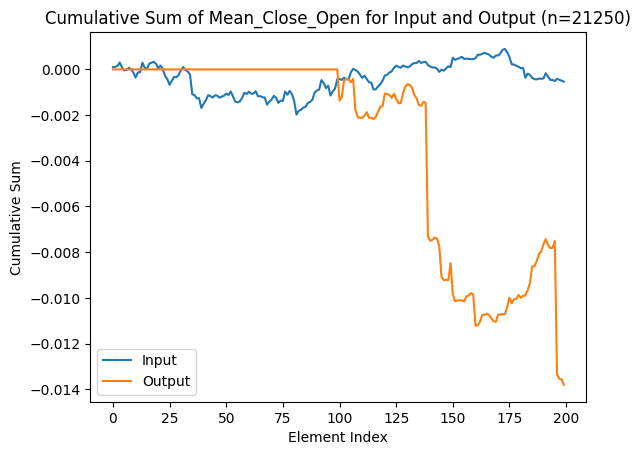

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


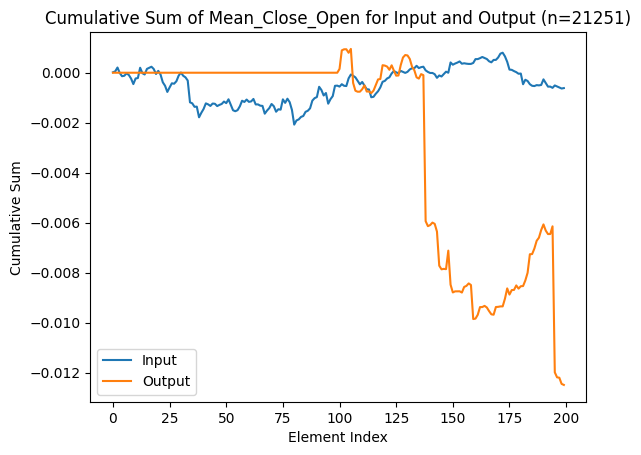

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


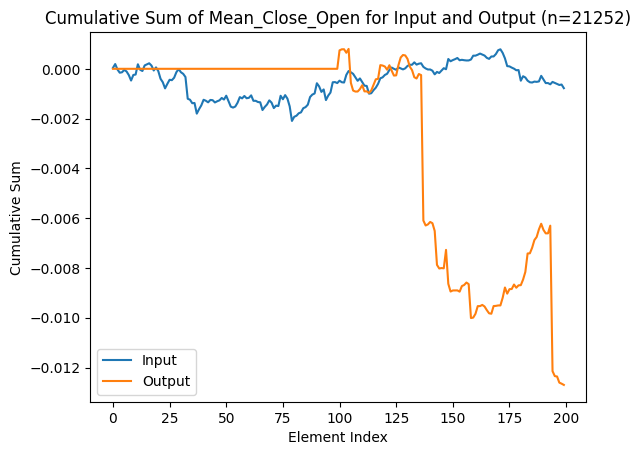

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


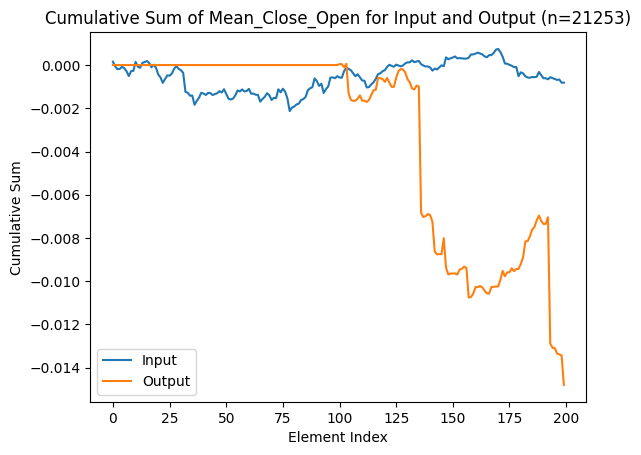

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


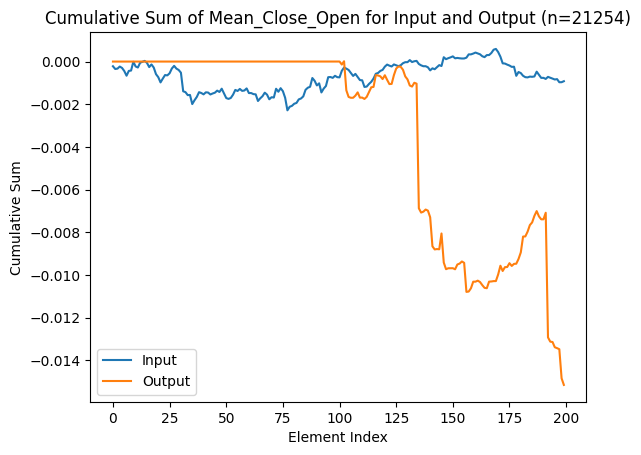

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


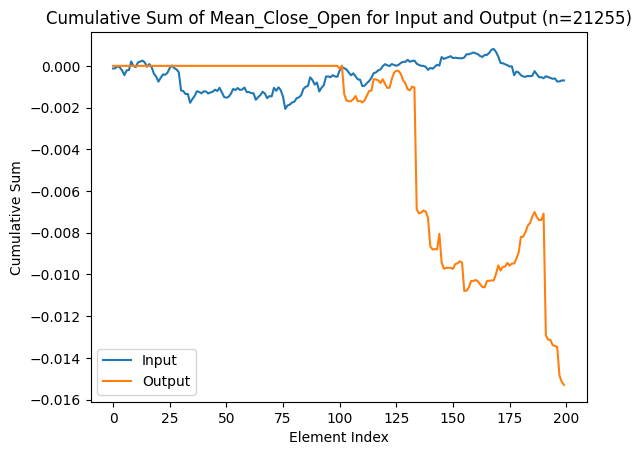

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


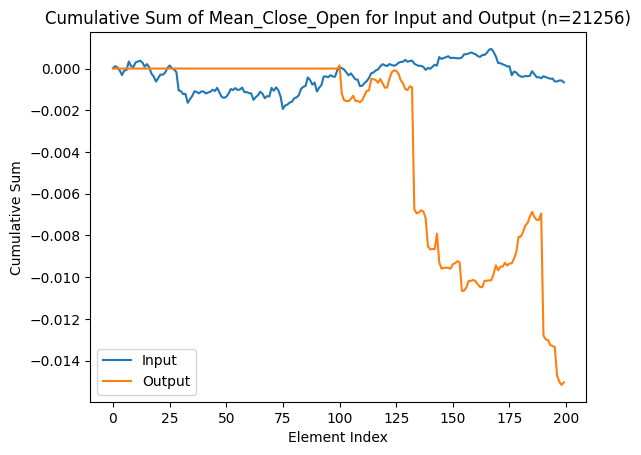

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


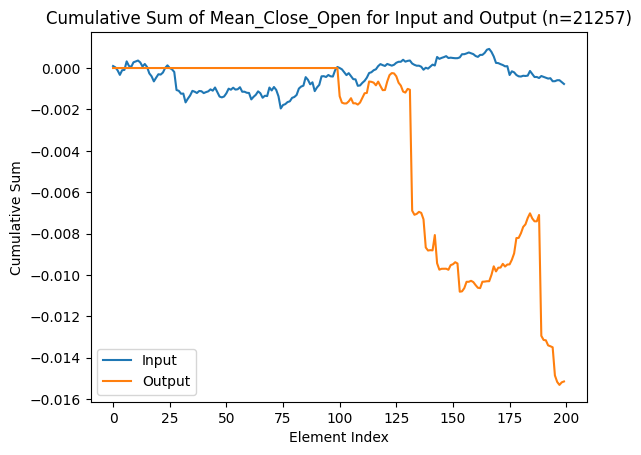

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


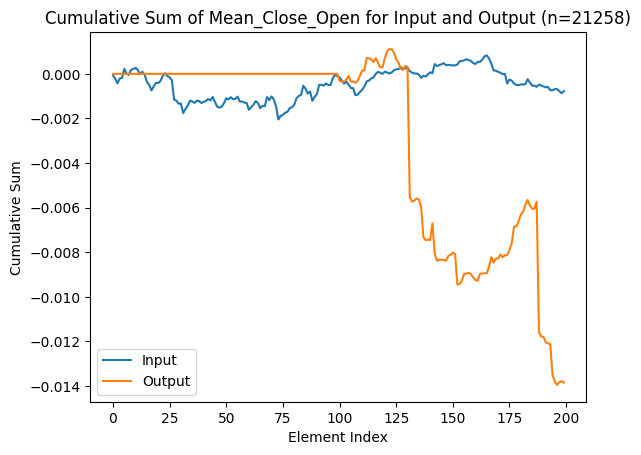

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


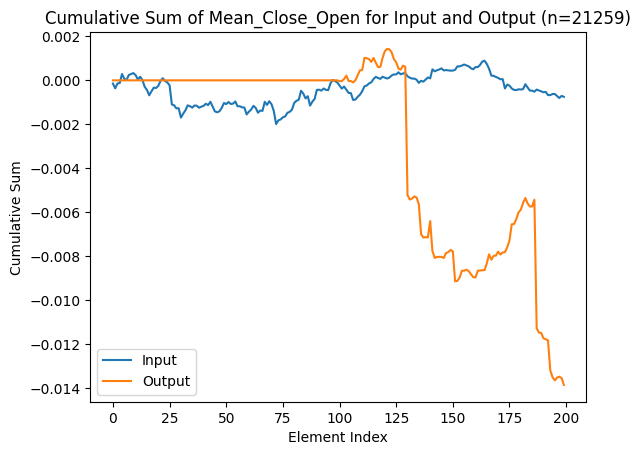

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


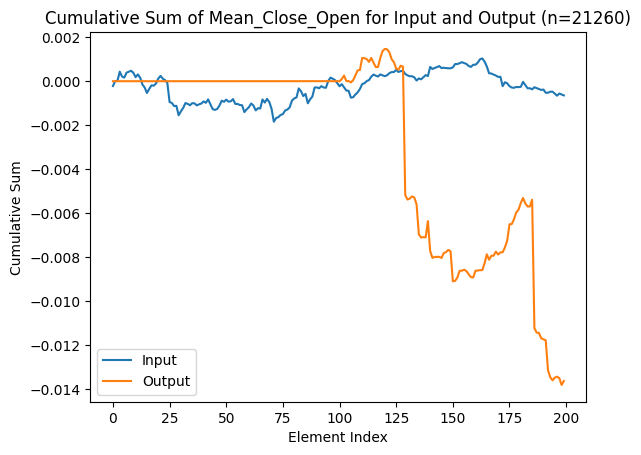

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


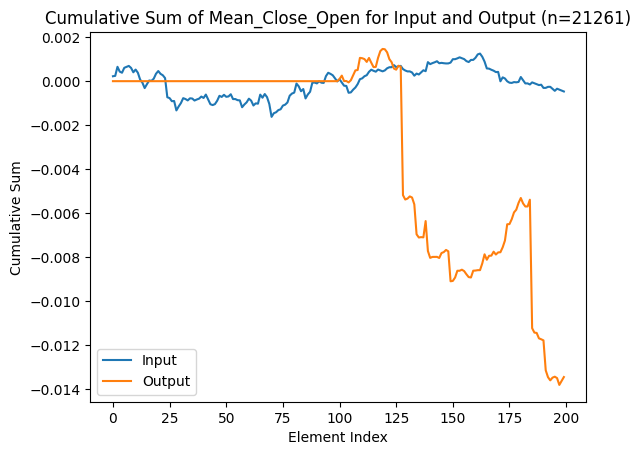

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


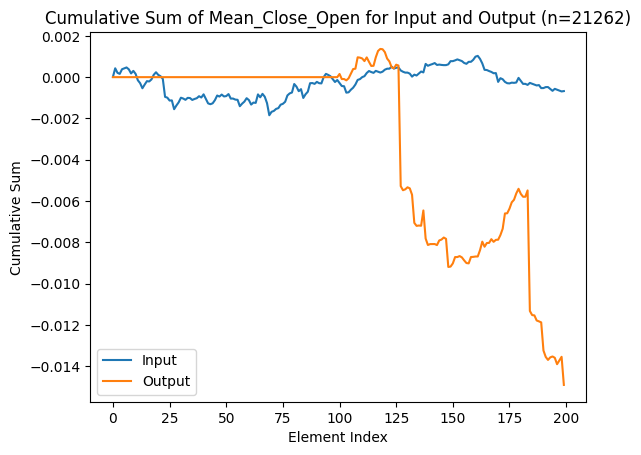

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


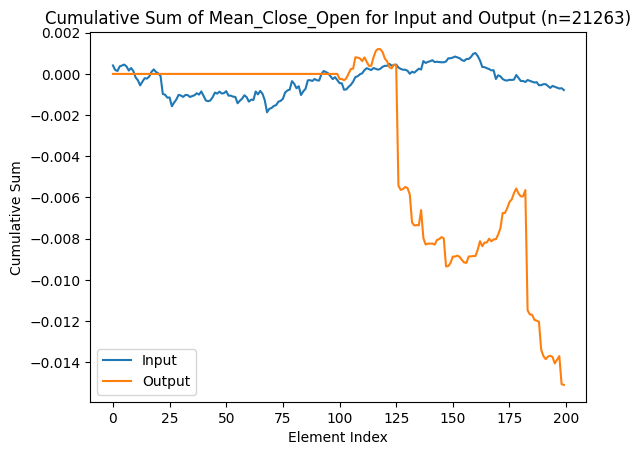

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


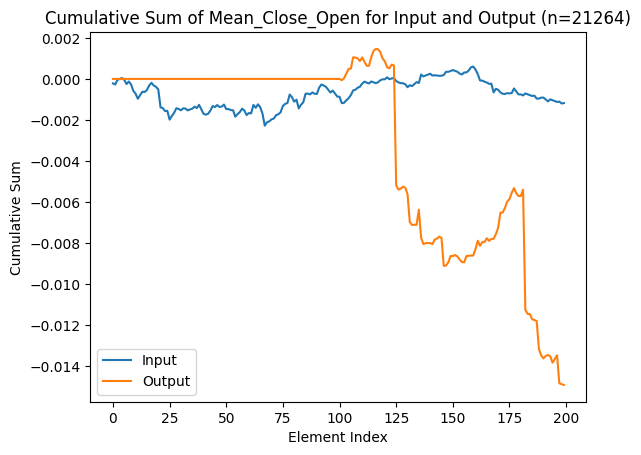

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


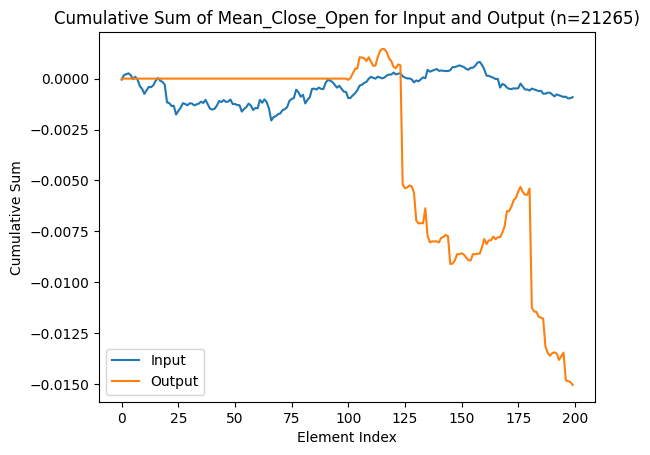

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


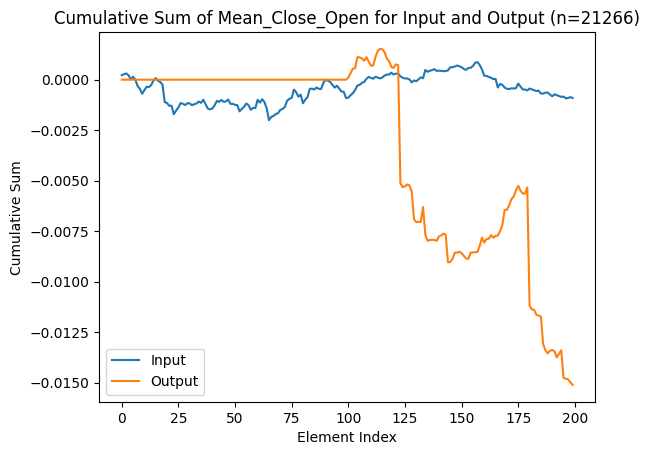

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


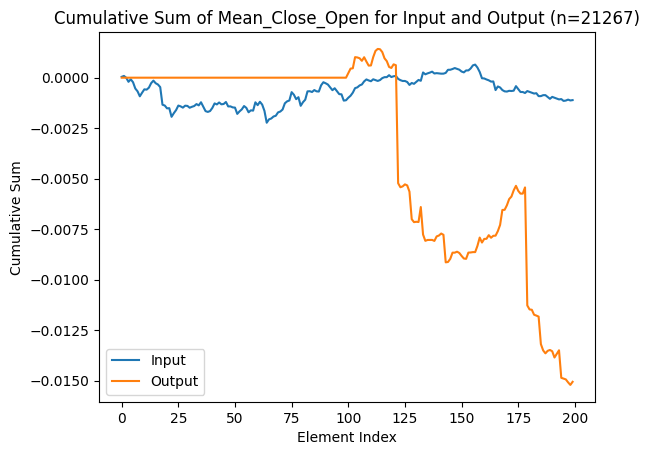

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


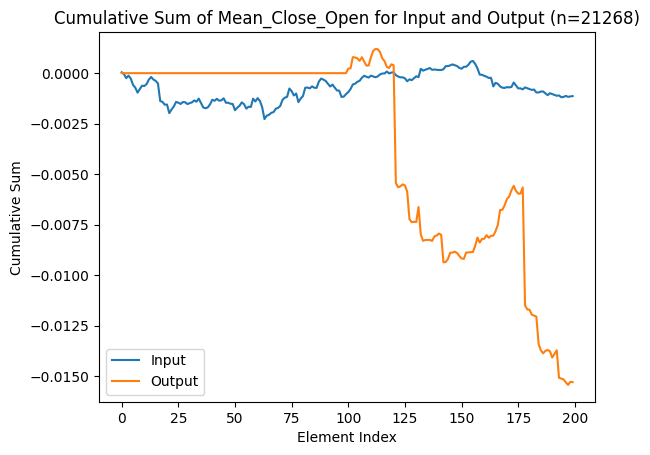

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


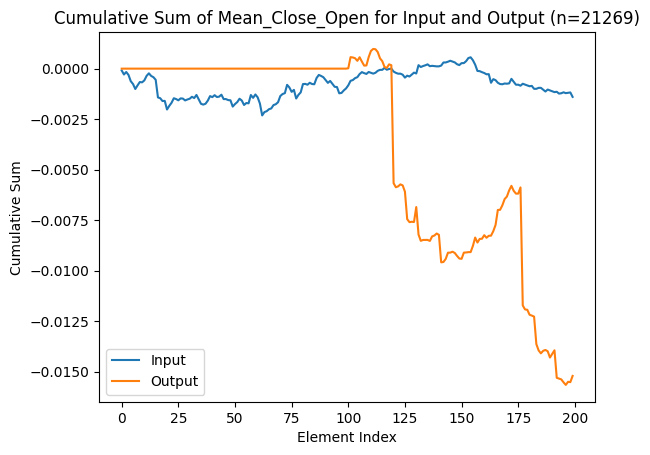

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


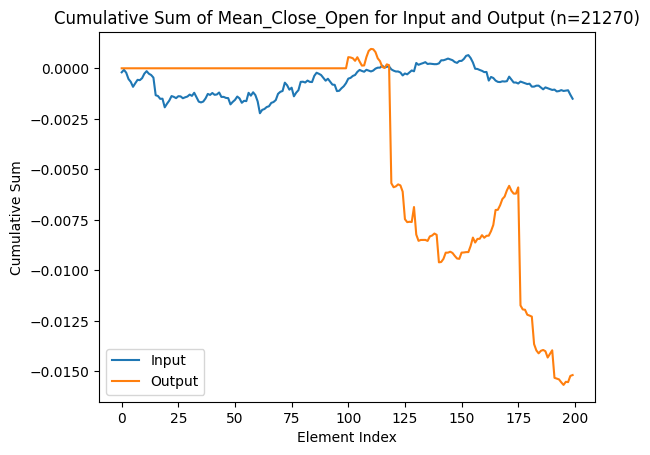

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


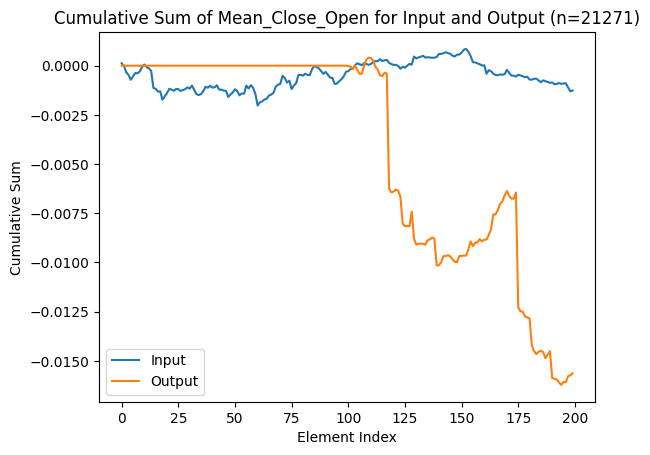

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


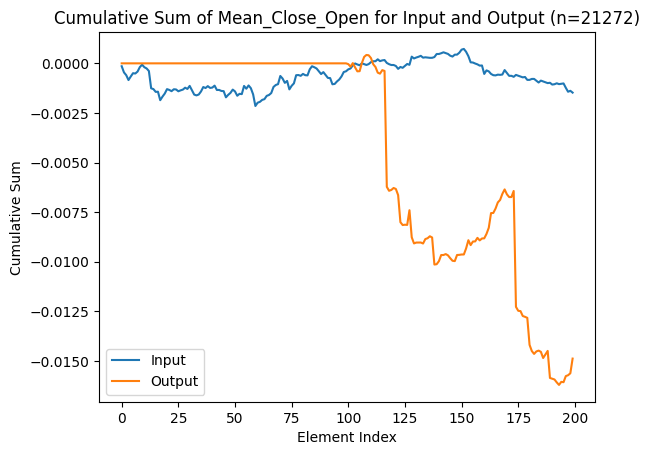

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


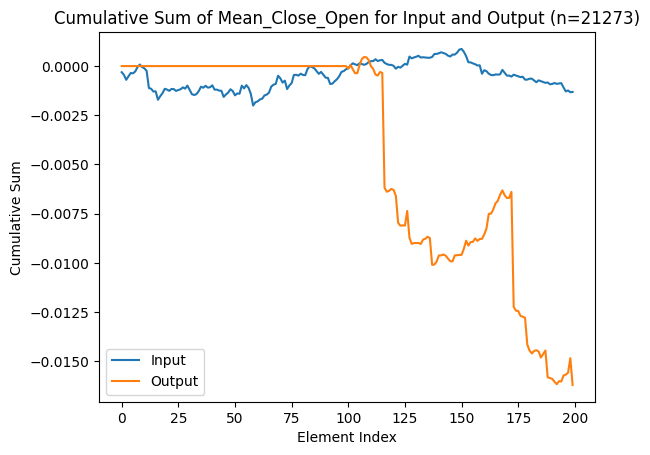

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


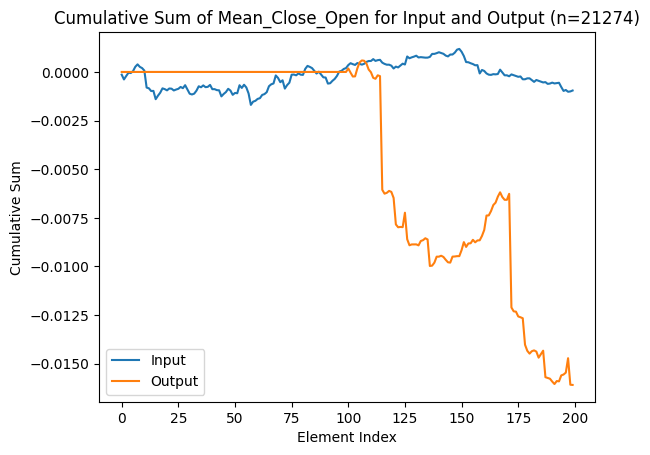

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


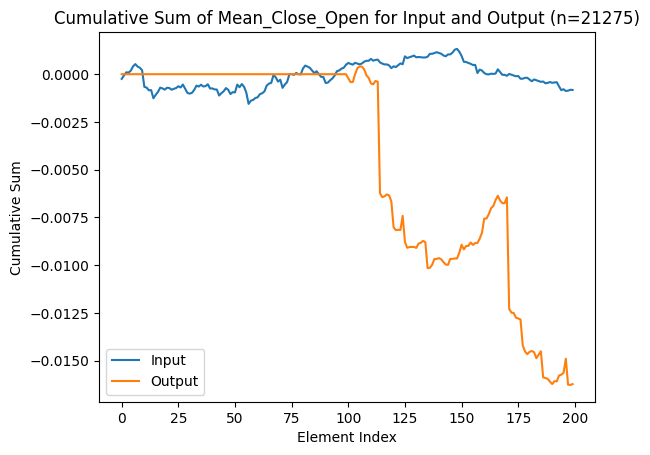

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


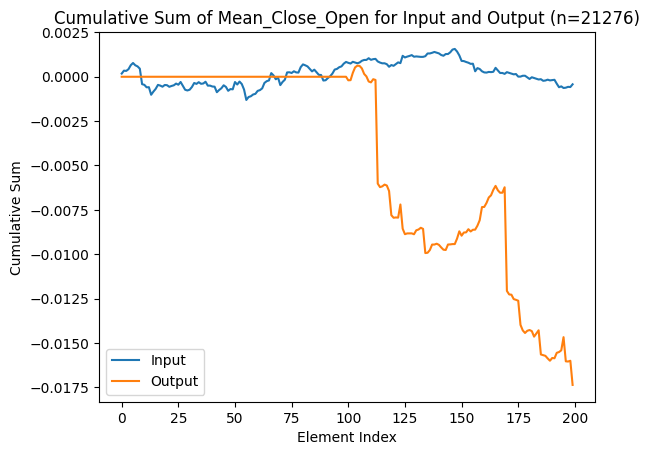

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


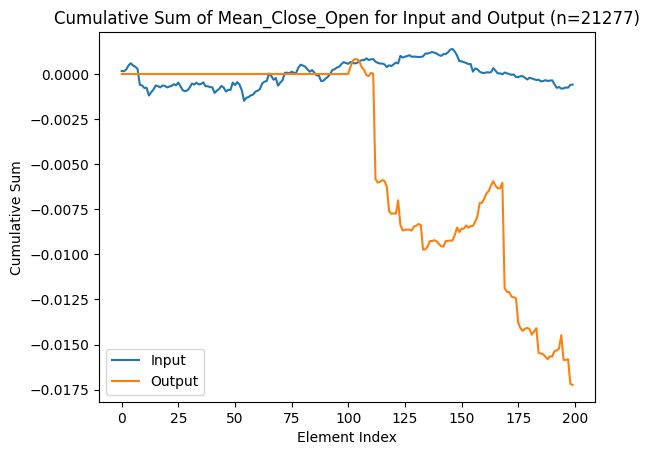

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


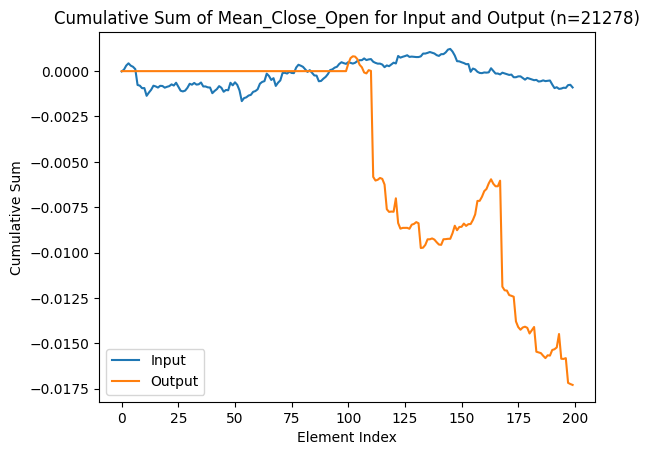

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


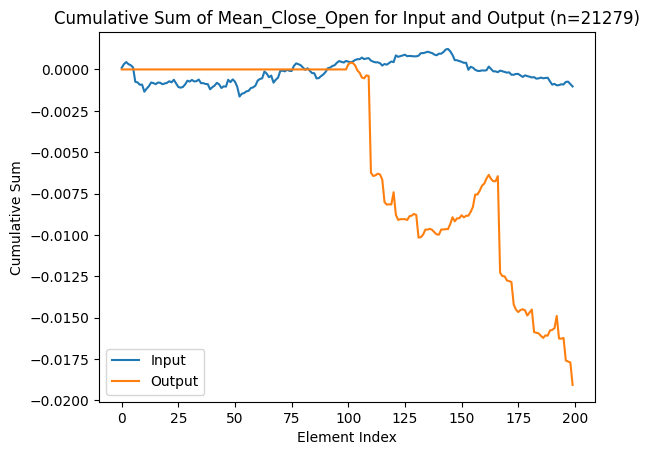

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


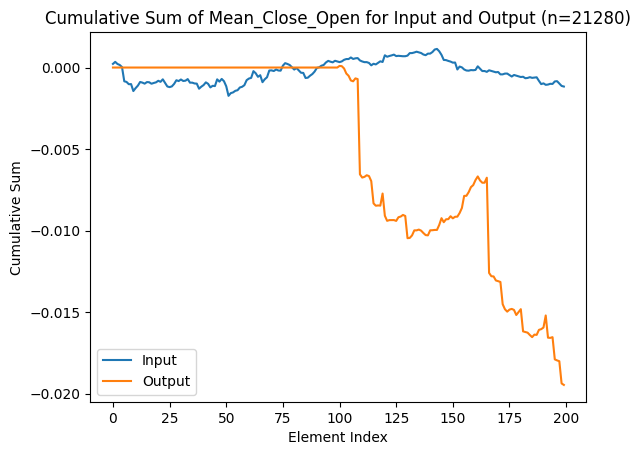

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


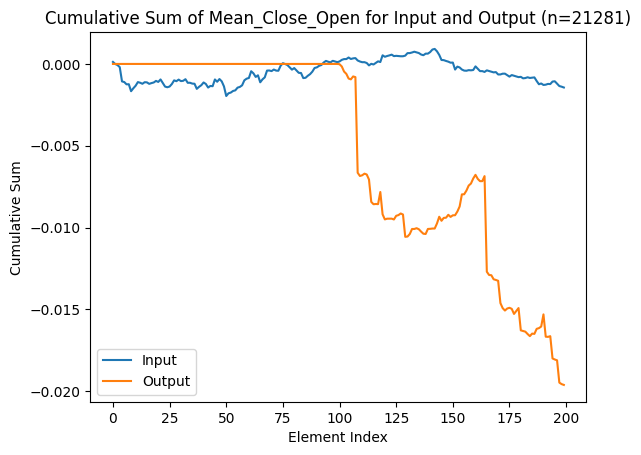

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


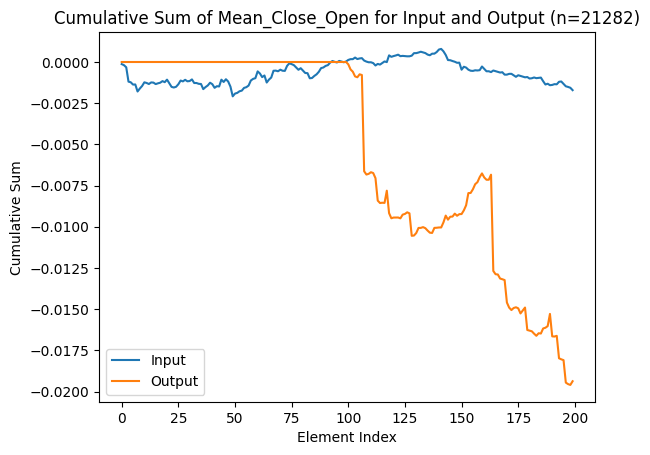

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


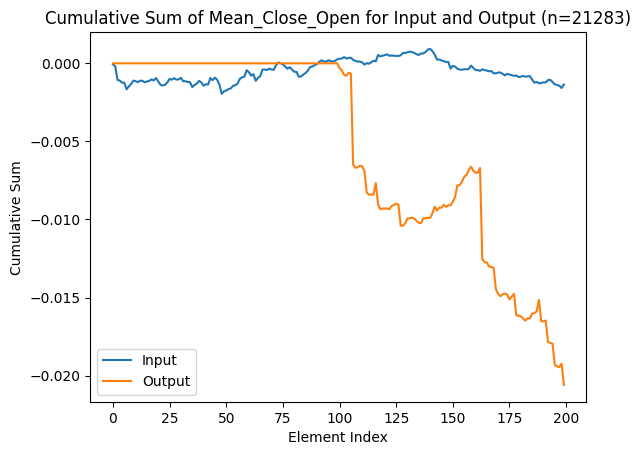

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


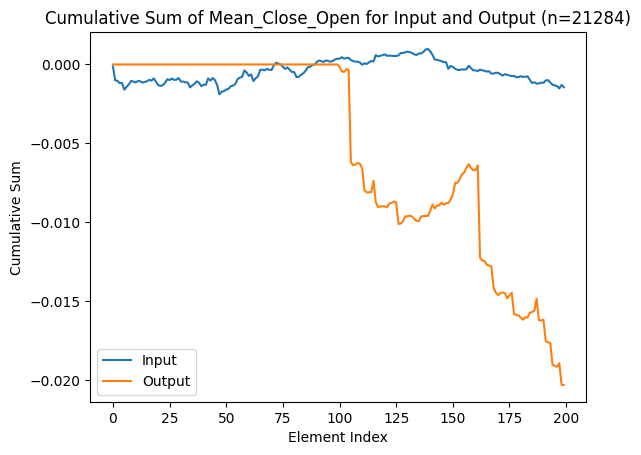

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


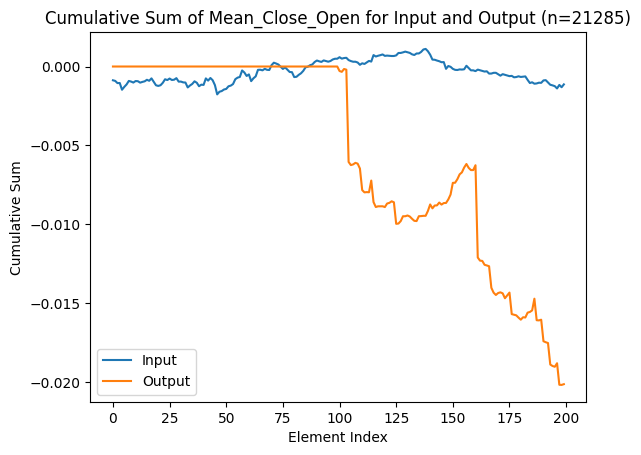

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


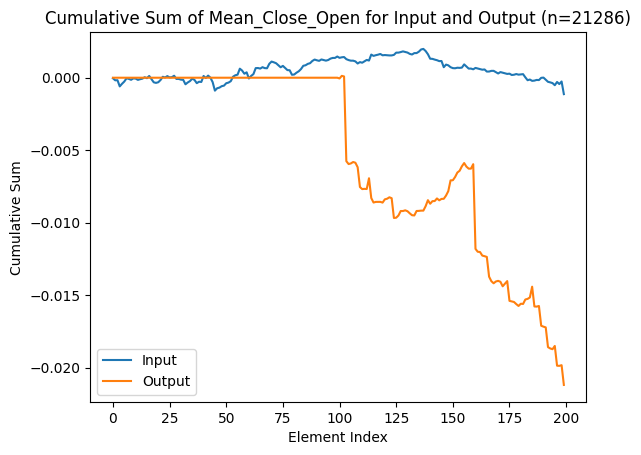

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


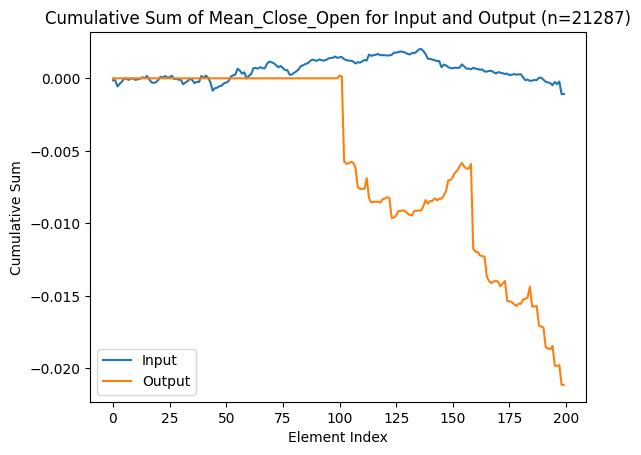

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


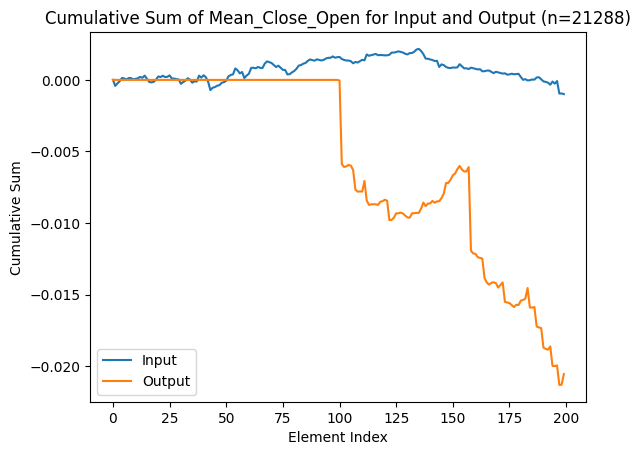

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


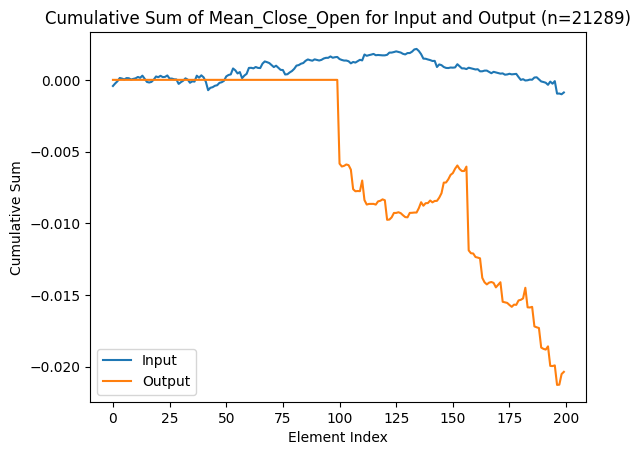

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


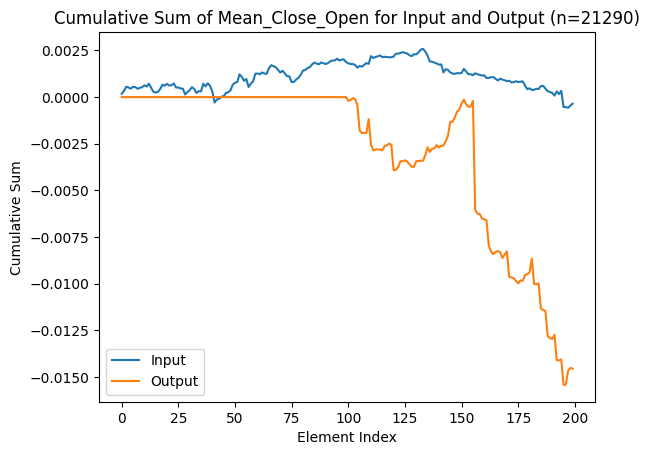

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


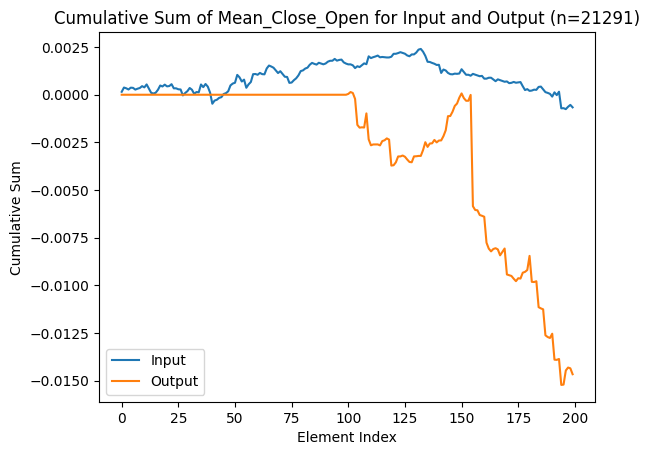

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


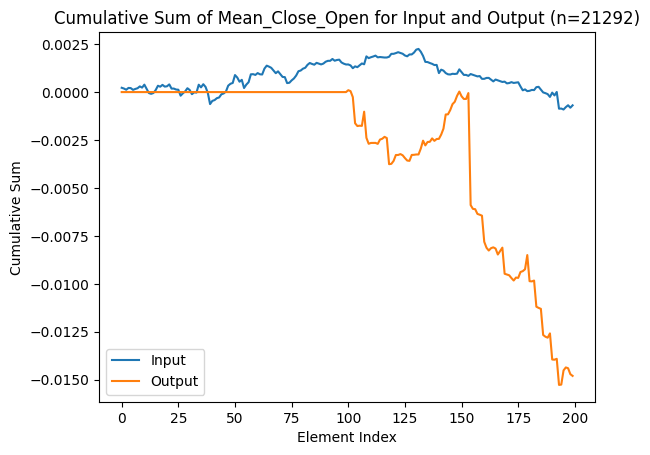

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


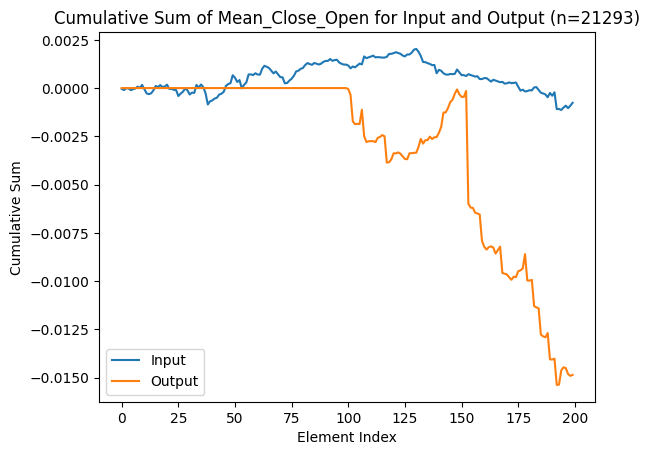

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


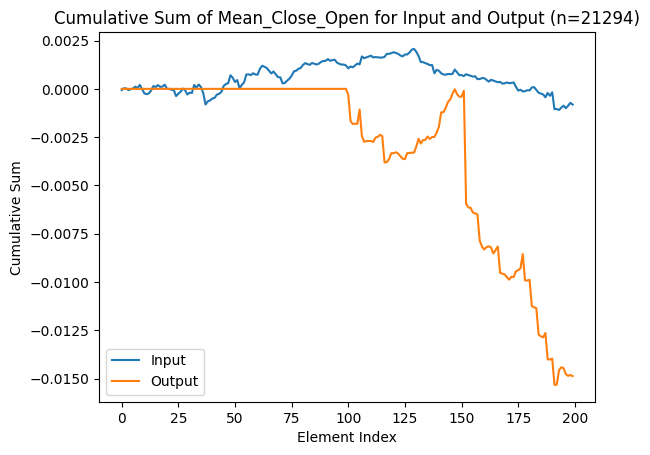

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


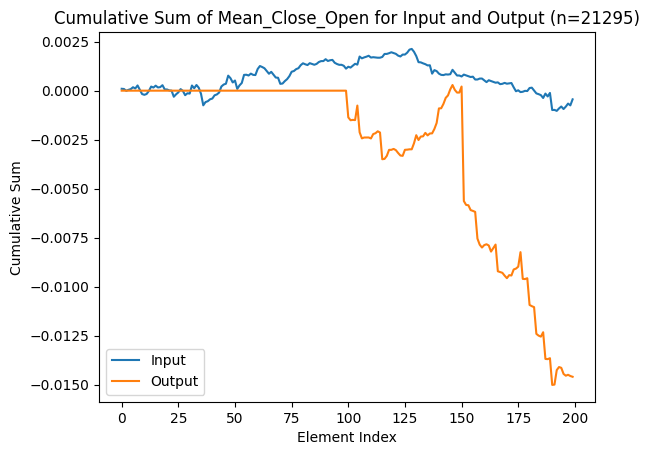

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


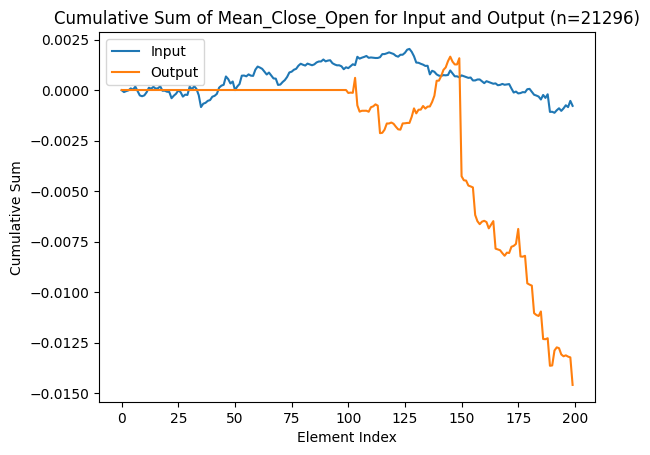

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


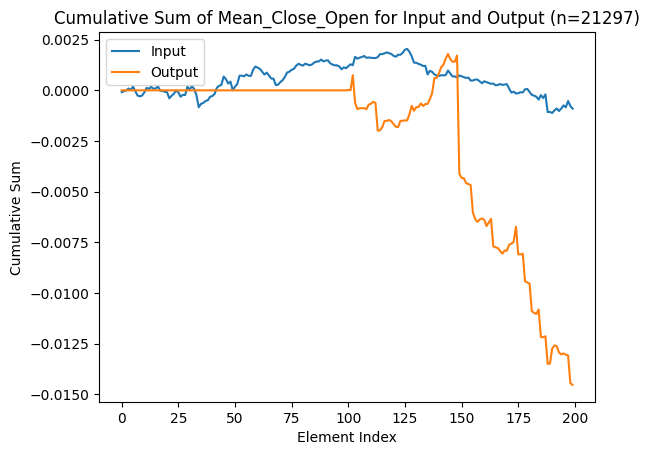

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


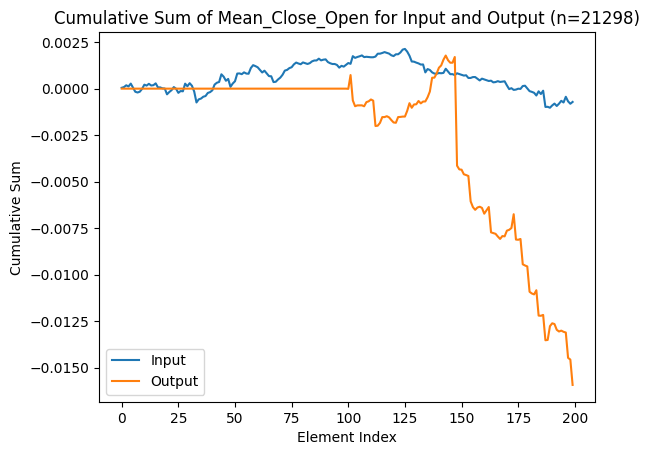

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


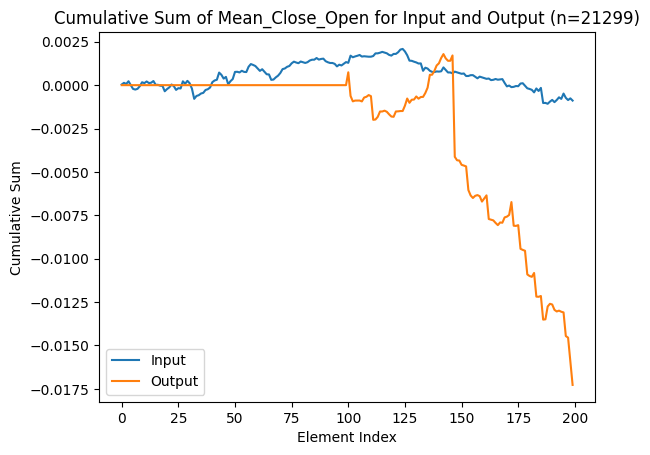

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


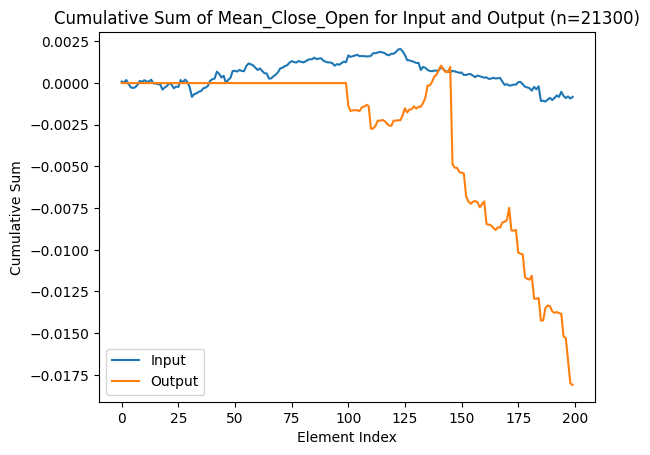

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


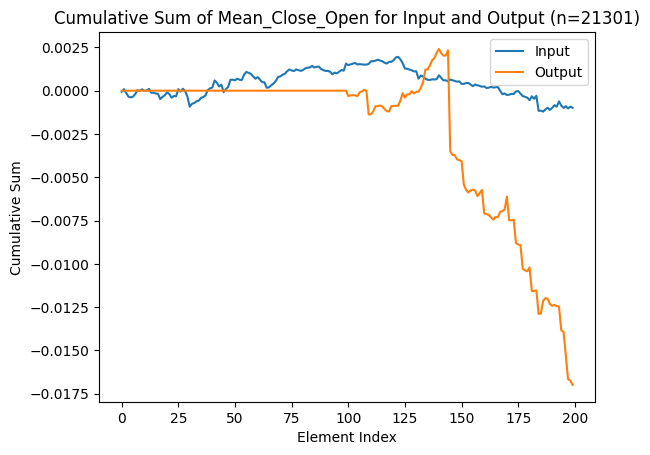

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


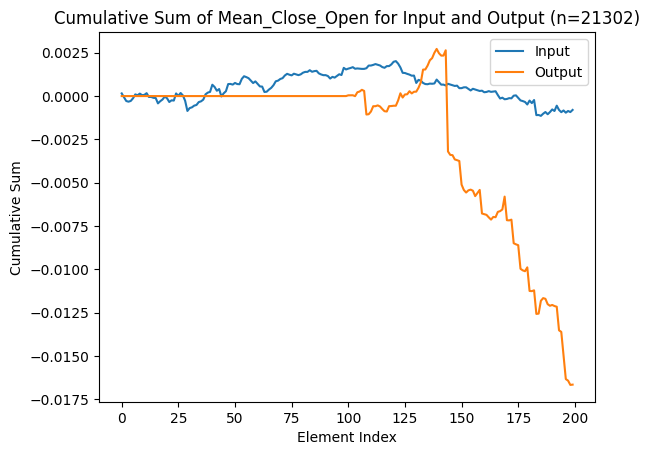

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


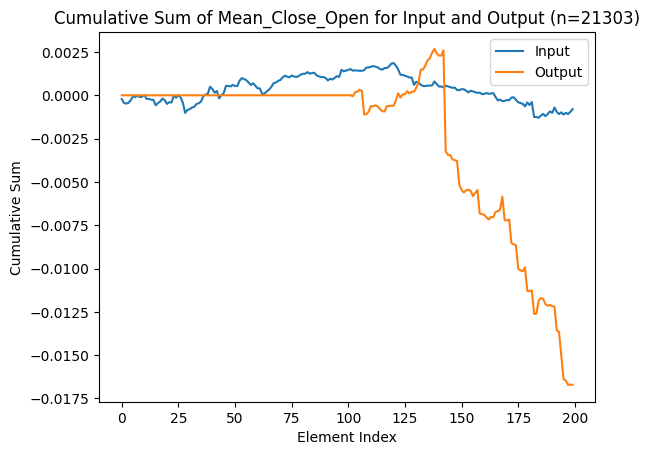

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


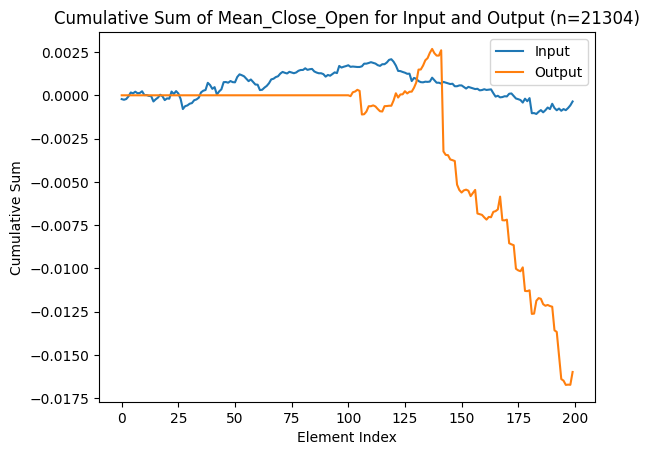

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


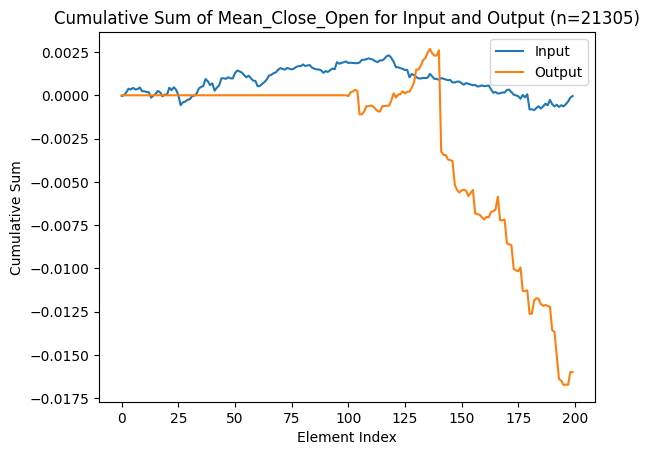

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


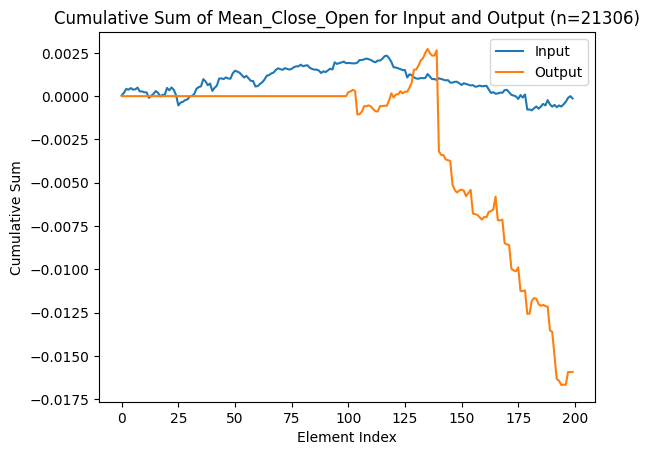

<ipython-input-145-2327ab08f6ff>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)


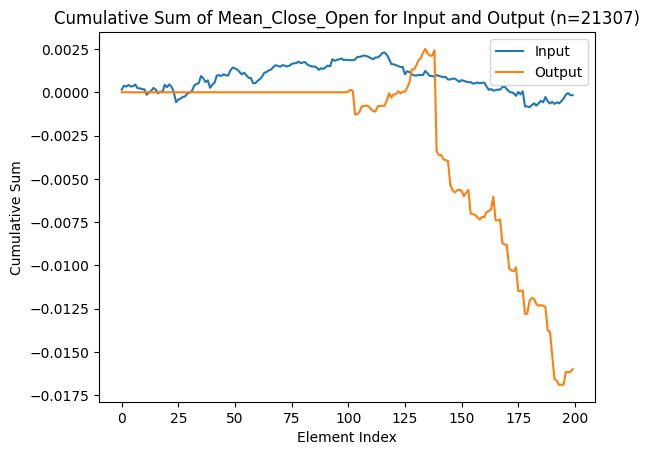

KeyboardInterrupt: ignored

In [ ]:
file_path = '/content/clval.txt'
with open(file_path, "r") as f:
    text = f.read()

# Загрузка файла means12.csv
means12 = pd.read_csv('/content/meangigkeras.csv')

# Разделение текста на номера и создание списка
numbers = text.split()
n = 0

# Создание датафрейма
df = pd.DataFrame(columns=['input_text', 'output_text'])
n=21100
# Итерация по тексту и заполнение датафрейма
# Итерация по тексту и заполнение датафрейма
while n + 50 < len(numbers):
    point=100
    input_text = " ".join(numbers[n:n + point])
    tokenized_input = tokenizer.tokenize(input_text)
    tokenized_input_with_bos = tf.convert_to_tensor([[tokenizer.token_to_id("[BOS]")] + tokenized_input])
    def token_logits_fn(inputs):
      cur_len = inputs.shape[1]
      output = model(inputs)
      return output[:, cur_len - 1, :]  # return next token logits
    output_tokens = keras_nlp.utils.greedy_search(
    token_logits_fn,
    tokenized_input_with_bos,
    max_length=NUM_TOKENS_TO_GENERATE,
)

    generated_text = tokenizer.detokenize(output_tokens)
    output_text = generated_text.numpy()[0].decode("utf-8").replace("[BOS]", "").strip()

    
    # Сохранение значений input_text и output_text в датафрейме
    df = df.append({'input_text': input_text, 'output_text': output_text}, ignore_index=True)

    # Преобразование номеров кластеров в значения Mean_Close_Open
    input_clusters = list(map(int, ' '.join(numbers[n:n + 200]).split()))  # Используется для вычисления input_clusters
    output_clusters = list(map(int, output_text.split()))

    input_mean_close_open = [means12.loc[means12['Cluster'] == cluster, 'avg(Close-Open)'].values[0] for cluster in input_clusters]
    output_mean_close_open = [means12.loc[means12['Cluster'] == cluster, 'avg(Close-Open)'].values[0] for cluster in output_clusters]

    # Вычисление cumsum массива
    cumsum_input = np.cumsum(np.array(input_mean_close_open))
    output_mean_close_open_shifted = [None] * point + output_mean_close_open
    cumsum_output = np.cumsum(np.array([x if x is not None else 0 for x in output_mean_close_open_shifted]))
    

    # Отображение графика cumsum
    plt.plot(cumsum_input, label='Input')
    plt.plot(cumsum_output, label='Output')

    plt.xlabel('Element Index')
    plt.ylabel('Cumulative Sum')
    plt.title(f'Cumulative Sum of Mean_Close_Open for Input and Output (n={n})')
    plt.legend()
    plt.show()
    plt.pause(1)  # Задержка на 1 секунду
    plt.close()  # Закрытие текущего графика

    n += 1

# Сохранение результатов в файл CSV
df.to_csv('results4411.csv', index=False)

print("Результаты сохранены в файл results1.csv")

In [ ]:
generated_text

<tf.Tensor: shape=(1,), dtype=string, numpy=
array([b'47 18 23 26 44 42 17 23 23 42 6 37 3 37 18 3 24 5 25 17 46 49 37 44 10 38 42 25 49 39 24 5 25 5 5 27 44 44 5 5 35 44 17 39 5 2 27 11 17 35 25 44 5 49 11 13 44 13 39 39 35 13 27 13 25 35 35 47 13 13 13 13 13 13 38 5 10 18 49 44 5 25 2 25 41 39 27 13 13 13 35 39 35 13 44 13 39 2 11 27 [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS]'],
      dtype=object)>

In [ ]:
input_text

'38 41 9 43 25 49 44 9 9 49 4 31 1 31 41 1 47 3 35 44 37 15 31 25 17 42 49 35 15 13 47 3 35 3 3 39 25 25 3 3 23 25 44 13 3 0 39 8 44 23 35 25 3 15 8 11 25 11 13 13 23 11 39 11 35 23 23 38 11 11 11 11 11 11 42 3 17 41 15 25 3 35 0 35 10 13 39 11 11 11 23 13 23 11 25 11 13 0 8 39'

In [ ]:
output_text

'47 18 23 26 44 42 17 23 23 42 6 37 3 37 18 3 24 5 25 17 46 49 37 44 10 38 42 25 49 39 24 5 25 5 5 27 44 44 5 5 35 44 17 39 5 2 27 11 17 35 25 44 5 49 11 13 44 13 39 39 35 13 27 13 25 35 35 47 13 13 13 13 13 13 38 5 10 18 49 44 5 25 2 25 41 39 27 13 13 13 35 39 35 13 44 13 39 2 11 27'

In [ ]:
generated_text

<tf.Tensor: shape=(1,), dtype=string, numpy=
array([b'47 18 23 26 44 42 17 23 23 42 6 37 3 37 18 3 24 5 25 17 46 49 37 44 10 38 42 25 49 39 24 5 25 5 5 27 44 44 5 5 35 44 17 39 5 2 27 11 17 35 25 44 5 49 11 13 44 13 39 39 35 13 27 13 25 35 35 47 13 13 13 13 13 13 38 5 10 18 49 44 5 25 2 25 41 39 27 13 13 13 35 39 35 13 44 13 39 2 11 27 [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS] [BOS]'],
      dtype=object)>